In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028933.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028394.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0027799.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028100.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0027960.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028872.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0026412.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0024872.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000

In [1]:
!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1 ultralytics>=8.3.0 matplotlib==3.8.0 efficientnet scikit-learn>=1.3.1 keras

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.


In [2]:
!pip install tensorflow==2.15.0 tensorflow-addons

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 92.4 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninstalling wrapt-1.17.0:
      Successfully uninstalled wrapt-1.17.0
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.4.1
    Uninstalling typeguard-4.4.1:
      Successfully uninstalled typeguard-4.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Succe

In [3]:
import os
import json
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_addons as tfa  # ✅ Fixed missing import
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Concatenate, Dense
from tensorflow.keras.models import Model
# Additional imports for YOLO and EfficientNet:
from efficientnet.tfkeras import EfficientNetB4
import torch
from PIL import Image
# Assuming YOLO and ControlNet models are available in your environment

from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

HAM10000 Part 1: ✅ /kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1
HAM10000 Part 2: ✅ /kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2
Metadata CSV: ✅ /kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv

Loaded metadata CSV with columns: ['lesion_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization']

Total HAM10000 entries found: 10015
Training samples: 8012, Validation samples: 2003

Train and validation folders created successfully!

Processed metadata saved to /kaggle/working/metadata_processed.json

Visualizing training samples...
Ultralytics 8.3.109 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Ultralytics 8.3.109 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Ultralytics 8.3.109 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
YOLOv8n summary (fused): 72 layers, 3,15

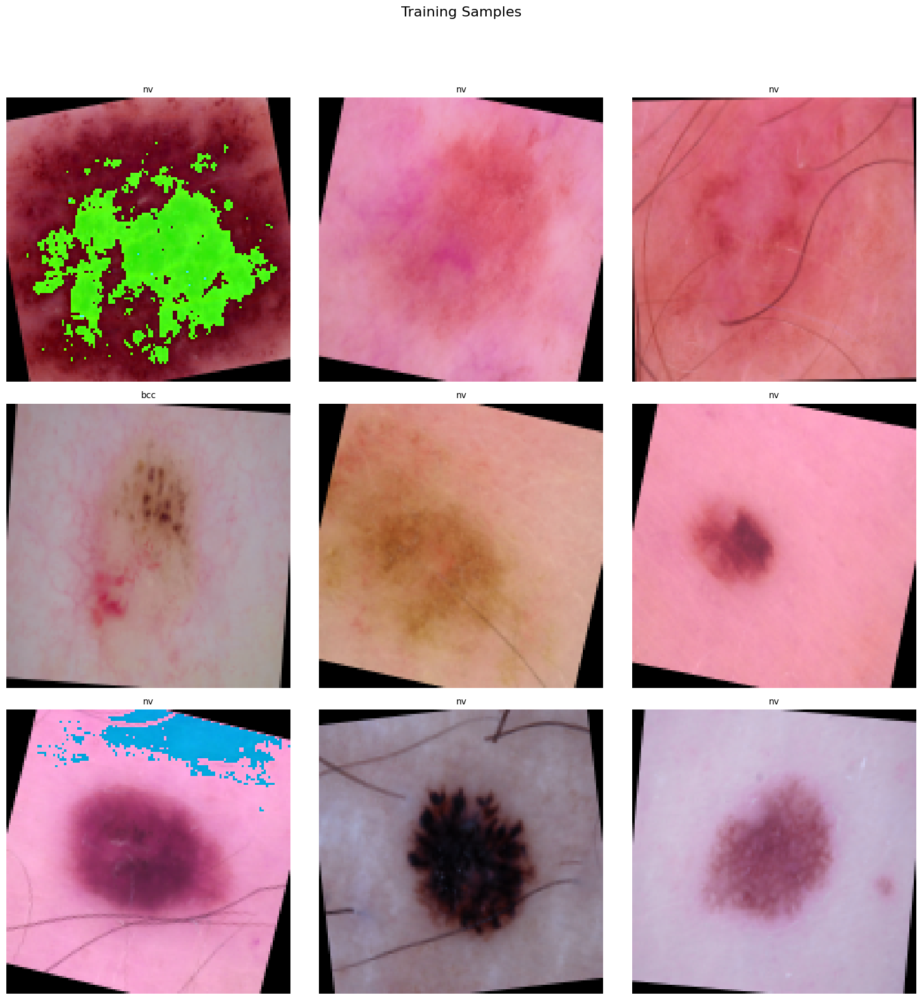


Visualizing validation samples...


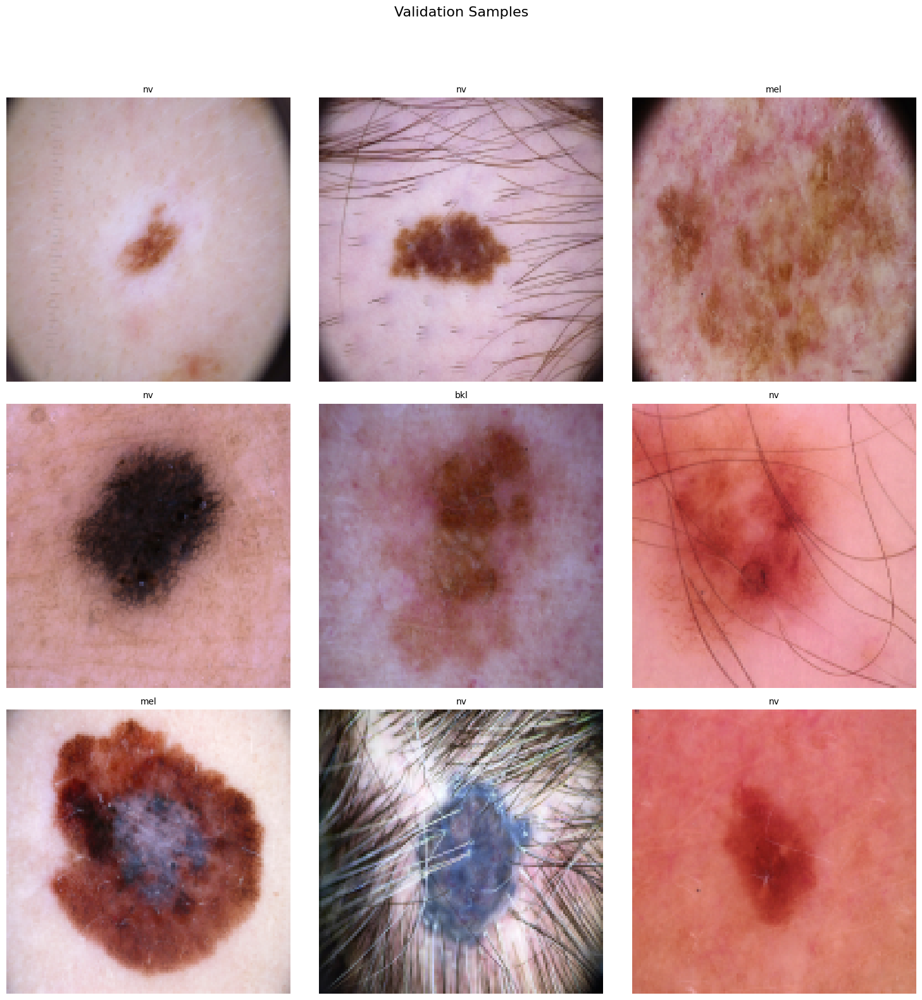

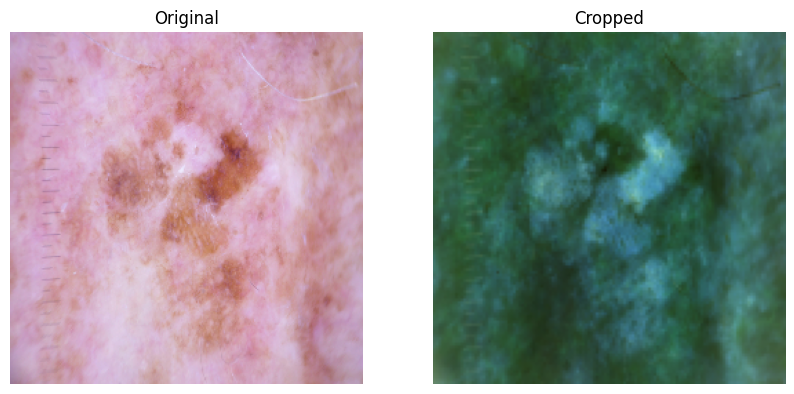

In [5]:
import os
import json
import pandas as pd
import shutil
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# Define base directory and dataset paths
base_dir = '/kaggle/input/skin-cancer-mnist-ham10000'
ham_part1_dir = os.path.join(base_dir, 'HAM10000_images_part_1')
ham_part2_dir = os.path.join(base_dir, 'HAM10000_images_part_2')
metadata_csv_path = os.path.join(base_dir, 'HAM10000_metadata.csv')

# Output directories for organized data (for tf.keras.preprocessing.image_dataset_from_directory)
train_dir = os.path.join('/kaggle/working', 'train')
val_dir = os.path.join('/kaggle/working', 'validation')
processed_metadata_json = os.path.join('/kaggle/working', 'metadata_processed.json')

# Label encoding map
label_map = {'nv': 0, 'mel': 1, 'bkl': 2, 'bcc': 3, 'akiec': 4, 'vasc': 5, 'df': 6}
class_names = list(label_map.keys())

# Verify dataset paths
def verify_paths():
    paths = {
        'HAM10000 Part 1': ham_part1_dir,
        'HAM10000 Part 2': ham_part2_dir,
        'Metadata CSV': metadata_csv_path
    }
    for name, path in paths.items():
        if not os.path.exists(path):
            raise FileNotFoundError(f"{name} not found at {path}")
        else:
            print(f"{name}: ✅ {path}")

verify_paths()

# Load metadata CSV
def process_metadata(metadata_csv):
    meta_df = pd.read_csv(metadata_csv)
    required_cols = ['image_id', 'lesion_id', 'dx', 'dx_type', 'age', 'sex', 'localization']
    for col in required_cols:
        if col not in meta_df.columns:
            raise ValueError(f"Missing column '{col}' in metadata CSV.")
    return meta_df

meta_df = process_metadata(metadata_csv_path)
print("\nLoaded metadata CSV with columns:", list(meta_df.columns))

# Aggregate image paths and create processed entries
def aggregate_image_paths(meta_df, part_dirs):
    processed_entries = []
    for _, row in meta_df.iterrows():
        image_id = row['image_id'] + ".jpg"
        found = False
        for folder in part_dirs:
            image_path = os.path.join(folder, image_id)
            if os.path.exists(image_path):
                processed_entries.append({
                    "image_id": image_id,
                    "lesion_id": row['lesion_id'],
                    "dx": row['dx'],
                    "dx_type": row['dx_type'],
                    "age": int(row['age']) if not pd.isna(row['age']) else -1,
                    "sex": row['sex'],
                    "localization": row['localization'],
                    "image_path": image_path
                })
                found = True
                break
        if not found:
            print(f"⚠️ Warning: {image_id} not found.")
    return processed_entries

ham_entries = aggregate_image_paths(meta_df, [ham_part1_dir, ham_part2_dir])
print(f"\nTotal HAM10000 entries found: {len(ham_entries)}")

# Create DataFrame and perform stratified train-test split
df = pd.DataFrame(ham_entries)
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['dx'], random_state=42)
print(f"Training samples: {len(train_df)}, Validation samples: {len(val_df)}")

# Create train/validation directories and copy images
for dest in [train_dir, val_dir]:
    os.makedirs(dest, exist_ok=True)

def copy_images_to_folders(df, dest_dir):
    for _, row in df.iterrows():
        label = row['dx']
        class_dir = os.path.join(dest_dir, label)
        os.makedirs(class_dir, exist_ok=True)
        shutil.copy(row['image_path'], os.path.join(class_dir, os.path.basename(row['image_path'])))

copy_images_to_folders(train_df, train_dir)
copy_images_to_folders(val_df, val_dir)
print("\nTrain and validation folders created successfully!")

# Save processed metadata in JSON format (for loading in detection model)
processed_metadata = {
    "features": {
        "label": {
            "names": class_names
        }
    },
    "entries": [{k: v for k, v in entry.items() if k != "image_path"} for entry in ham_entries]
}
with open(processed_metadata_json, 'w') as f:
    json.dump(processed_metadata, f, indent=2)
print(f"\nProcessed metadata saved to {processed_metadata_json}")

# ---------------------------
# Data augmentation function (for TF dataset)
# ---------------------------
def augment_image(image):
    image = tf.image.random_hue(image, max_delta=0.08)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    angle = tf.random.uniform([], minval=-15, maxval=15, dtype=tf.float32) * (3.14159265 / 180)
    image = tfa.image.rotate(image, angles=angle, interpolation='BILINEAR')
    return image

# ---------------------------
# YOLO integration: detection & cropping function
# ---------------------------
from ultralytics import YOLO
yolo_model = YOLO('yolov8n.pt', task='detect')
yolo_model.fuse = lambda verbose=False: None

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.5):
    import cv2
    image_np = (image_tensor * 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    results = yolo_model(image_bgr, verbose=False)
    if len(results) > 0:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if valid_boxes.size > 0:
            areas = (valid_boxes[:,2] - valid_boxes[:,0]) * (valid_boxes[:,3] - valid_boxes[:,1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            # No padding added for simplicity
            h, w = image_bgr.shape[:2]
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w, x2), min(h, y2)
            cropped = image_bgr[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped.astype(np.float32) / 255.0
    resized = cv2.resize(image_bgr, (target_size, target_size))
    resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)

# ---------------------------
# Create TensorFlow Dataset using tf.numpy_function
# ---------------------------
def create_tf_dataset(entries, target_size=(128, 128), augment_flag=False):
    file_paths = [entry['image_path'] for entry in entries]
    labels = [label_map[entry['dx']] for entry in entries]
    
    ds = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    
    def _load_process_crop(file_path, label):
        def _process_image(fp):
            image_bytes = tf.io.read_file(fp)
            image = tf.image.decode_jpeg(image_bytes, channels=3)
            image = tf.image.resize(image, [256, 256])
            return tf.cast(image, tf.float32) / 255.0
        image = tf.py_function(func=_process_image, inp=[file_path], Tout=tf.float32)
        image.set_shape([256, 256, 3])
        
        cropped = tf.numpy_function(
            func=yolo_crop_wrapper,
            inp=[image],
            Tout=tf.float32
        )
        cropped.set_shape((target_size[0], target_size[1], 3))
        
        if augment_flag:
            cropped = augment_image(cropped)
        return cropped, tf.one_hot(label, depth=7)
    
    return ds.map(_load_process_crop, num_parallel_calls=tf.data.AUTOTUNE)

# Create the dataset
tf_train_ds = create_tf_dataset(train_df.to_dict('records'), augment_flag=True)
tf_val_ds = create_tf_dataset(val_df.to_dict('records'), augment_flag=False)

tf_train_ds = tf_train_ds.shuffle(1000).batch(32).prefetch(tf.data.AUTOTUNE)
tf_val_ds = tf_val_ds.batch(32).prefetch(tf.data.AUTOTUNE)

def visualize_dataset(dataset, class_names, title="Sample Batch", max_samples=9):
    plt.figure(figsize=(15, 15))
    plt.suptitle(title, fontsize=16, y=1.05)
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = np.argmax(labels.numpy(), axis=1)
        images = (images * 255).astype(np.uint8)
        for i in range(min(max_samples, len(images))):
            ax = plt.subplot(3, 3, i+1)
            plt.imshow(images[i])
            plt.title(f"{class_names[labels[i]]}", fontsize=10)
            plt.axis("off")
    plt.tight_layout()
    plt.show()

print("\nVisualizing training samples...")
visualize_dataset(tf_train_ds, class_names, title="Training Samples")
print("\nVisualizing validation samples...")
visualize_dataset(tf_val_ds, class_names, title="Validation Samples")

test_image_path = df.iloc[0]['image_path']
test_image = tf.io.read_file(test_image_path)
test_image = tf.image.decode_jpeg(test_image, channels=3)
test_image = tf.image.resize(test_image, [256, 256]).numpy()
test_image = np.clip(test_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(test_image)
plt.title("Original")
plt.axis('off')

cropped = yolo_crop_wrapper(test_image)
plt.subplot(122)
plt.imshow((cropped * 255).astype(np.uint8))
plt.title("Cropped")
plt.axis('off')
plt.show()


In [ ]:
!pip install opencv-python-headless

In [ ]:
#chatgpt version with focal loss and others 
import os
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Input, 
                                     Dropout, Lambda, RandomFlip, RandomRotation,
                                     RandomContrast, RandomZoom, BatchNormalization)
from tensorflow.keras.models import Model
import tensorflow_addons as tfa
import torch
from torch.cuda.amp import autocast  # For mixed precision in PyTorch
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
from ultralytics import YOLO
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# ---------------------------
# Mixed Precision Setup (TF)
# ---------------------------
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
print("Mixed precision enabled. Global policy:", mixed_precision.global_policy())

# ---------------------------
# GPU Optimization Settings for TF
# ---------------------------
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Enabled memory growth on GPU(s).")
    except RuntimeError as e:
        print(e)
tf.config.optimizer.set_jit(True)
print("XLA JIT compilation is enabled.")

# Set device for PyTorch models
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Running on: {DEVICE}")

# ---------------------------
# Custom Orthogonal Regularizer
# ---------------------------
class OrthogonalRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, strength=1e-4):
        self.strength = strength
    def __call__(self, x):
        x_flat = tf.reshape(x, (-1, x.shape[-1]))
        prod = tf.matmul(tf.transpose(x_flat), x_flat)
        identity = tf.eye(tf.shape(prod)[0])
        diff = prod - identity
        return self.strength * tf.reduce_sum(tf.square(diff))
    def get_config(self):
        return {'strength': float(self.strength)}

# ---------------------------
# Advanced Custom Data Augmentation
# ---------------------------
def advanced_augment(image):
    # Apply random brightness and contrast adjustments
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    # You can add additional augmentations here as needed.
    return image

# ---------------------------
# Improved YOLO-based Detection & Cropping Function
# ---------------------------
yolo_model = YOLO('yolov8n.pt', task='detect')

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.6):
    # Convert normalized [0,1] image to uint8 for YOLO processing
    image_np = (image_tensor * 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    
    results = yolo_model(image_bgr, verbose=False)
    if len(results) > 0 and results[0].boxes is not None:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if valid_boxes.size > 0:
            # Choose the box with the largest area
            areas = (valid_boxes[:, 2] - valid_boxes[:, 0]) * (valid_boxes[:, 3] - valid_boxes[:, 1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            # Expand the bounding box by 10% on all sides for context
            pad_x = int(0.1 * (x2 - x1))
            pad_y = int(0.1 * (y2 - y1))
            x1, y1 = max(0, x1 - pad_x), max(0, y1 - pad_y)
            x2, y2 = x2 + pad_x, y2 + pad_y
            cropped = image_bgr[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped_rgb = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped_rgb.astype(np.float32) / 255.0
    # Fallback if detection fails
    resized = cv2.resize(image_bgr, (target_size, target_size))
    resized_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized_rgb.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)

# ---------------------------
# Custom Focal Loss Function
# ---------------------------
import tensorflow.keras.backend as K
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = 1e-7
        y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
        loss = -y_true * alpha * K.pow((1 - y_pred), gamma) * K.log(y_pred)
        return K.sum(loss, axis=1)
    return focal_loss_fixed

# ---------------------------
# Learning Rate Scheduler Callback (ReduceLROnPlateau)
# ---------------------------
lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    verbose=1,
    mode='min',
    min_lr=1e-6
)

# ---------------------------
# Callback for Gradual Unfreezing
# ---------------------------
def gradual_unfreeze(model, epoch, unfrozen=False):
    # At epoch 10, unfreeze last 30% of EfficientNet layers if not already done
    if epoch == 10 and not gradual_unfreeze.unfrozen:
        print("Epoch 10 reached: Unfreezing additional EfficientNet layers.")
        for layer in model.layers:
            # Check if this layer belongs to EfficientNet (commonly its name contains 'efficientnet')
            if 'efficientnet' in layer.name.lower():
                total = len(layer.layers)
                # Unfreeze last 30% layers of this sub-model
                for sub_layer in layer.layers[int(0.7 * total):]:
                    sub_layer.trainable = True
        # Recompile the model with a lower learning rate for fine-tuning
        tf.keras.backend.set_value(model.optimizer.lr, 1e-4)
        print("Learning rate lowered to 1e-4 for fine-tuning.")
        gradual_unfreeze.unfrozen = True
gradual_unfreeze.unfrozen = False

unfreeze_callback = tf.keras.callbacks.LambdaCallback(
    on_epoch_begin=lambda epoch, logs: gradual_unfreeze(mediscan.model, epoch)
)

# ---------------------------
# MediScan Detection Model with Improvements
# ---------------------------
class MediScanDetectionModel:
    def __init__(self, num_classes=7, img_size=128):
        self.num_classes = num_classes
        self.img_size = img_size
        self.metadata = None
        self.model = None

    def load_metadata(self, metadata_path):
        with open(metadata_path, 'r') as f:
            loaded_meta = json.load(f)
        if isinstance(loaded_meta, list):
            unique_labels = sorted({entry['dx'] for entry in loaded_meta})
            self.metadata = {
                "features": {"label": {"names": unique_labels, "count": len(unique_labels)}},
                "samples": loaded_meta
            }
        else:
            self.metadata = loaded_meta
        print("Loaded metadata with classes:", self.metadata['features']['label']['names'])

    def build_ensemble(self):
        input_img = Input(shape=(self.img_size, self.img_size, 3), name='input_image')
        
        # Apply built-in augmentation layers
        x = RandomFlip("horizontal_and_vertical")(input_img)
        x = RandomRotation(0.3)(x)
        x = RandomContrast(0.2)(x)
        x = RandomZoom(0.2)(x)
        # Further custom augmentation
        x = Lambda(lambda img: advanced_augment(img), name='advanced_aug')(x)
        
        # YOLO-based cropping is applied via map_fn
        def detect_and_crop(batch):
            return tf.map_fn(lambda img: tf.numpy_function(yolo_crop_wrapper, [img], tf.float32),
                             batch, fn_output_signature=tf.float32)
        cropped_imgs = Lambda(detect_and_crop, name='yolo_crop')(x)
        cropped_imgs.set_shape((None, self.img_size, self.img_size, 3))
        
        # Build EfficientNetB4 backbone (using cropped images) for feature extraction
        effnet = EfficientNetB4(include_top=False, weights='imagenet', input_tensor=cropped_imgs)
        # Freeze the first 150 layers initially
        for layer in effnet.layers[:150]:
            layer.trainable = False
        
        features = GlobalAveragePooling2D()(effnet.output)
        # Reduce dropout from 0.8 to 0.5 for better information flow
        dropout_layer = Dropout(0.5)(features)
        dense_layer = Dense(1024, activation='relu', 
                            kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=1e-4))(dropout_layer)
        bn_layer = BatchNormalization()(dense_layer)
        outputs = Dense(self.num_classes, activation='softmax',
                        kernel_regularizer=OrthogonalRegularizer(1e-4))(bn_layer)
        
        self.model = Model(inputs=input_img, outputs=outputs)
        print("Enhanced model built with YOLO-based cropping and advanced anti-overfitting measures.")

    def compile_model(self):
        # Use AdamW optimizer with a conservative learning rate
        optimizer = tfa.optimizers.AdamW(learning_rate=1e-4, weight_decay=1e-4, clipnorm=1.0)
        self.model.compile(
            optimizer=optimizer,
            loss=focal_loss(),  # Focal loss to focus on hard examples
            metrics=[
                tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
                tfa.metrics.F1Score(num_classes=self.num_classes, average='macro', name='f1_score'),
                tfa.metrics.CohenKappa(num_classes=self.num_classes, name='kappa'),
                tf.keras.metrics.Precision(name='precision'),
                tf.keras.metrics.Recall(name='recall'),
                tf.keras.metrics.AUC(name='auc', multi_label=True)
            ]
        )
        print("Model compiled with focal loss, reduced learning rate, and advanced metrics.")

    def train(self, train_ds, val_ds, epochs=50):
        callbacks = [
            tf.keras.callbacks.EarlyStopping(
                monitor='val_f1_score',
                patience=10,
                mode='max',
                restore_best_weights=True,
                min_delta=0.001
            ),
            tf.keras.callbacks.CSVLogger('training_log.csv'),
            tf.keras.callbacks.ModelCheckpoint(
                filepath='best_model.keras',
                monitor='val_f1_score',
                save_best_only=True,
                save_weights_only=True,
                mode='max',
                verbose=1
            ),
            lr_reducer,
            unfreeze_callback
        ]
        history = self.model.fit(
            train_ds.prefetch(tf.data.AUTOTUNE),
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            verbose=1
        )
        return history

# ---------------------------
# Optimized GEN-AI Pipeline with Memory Management
# ---------------------------
class MediScanGenAIPipeline:
    def __init__(self):
        self.pipe = None
        self.controlnet = None

    def init_genai(self):
        """Memory-optimized initialization for the generative AI pipeline."""
        # Clear CUDA cache before loading large models
        torch.cuda.empty_cache()
        self.controlnet = ControlNetModel.from_pretrained(
            "diffusers/controlnet-canny-sdxl-1.0",
            torch_dtype=torch.float16,
            use_safetensors=True
        )
        self.pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
            "stabilityai/stable-diffusion-xl-base-1.0",
            controlnet=self.controlnet,
            torch_dtype=torch.float16,
            variant="fp16",
            use_safetensors=True
        )
        # Enable offloading to CPU and memory efficient attention to reduce GPU usage
        self.pipe.enable_model_cpu_offload()
        self.pipe.scheduler = UniPCMultistepScheduler.from_config(self.pipe.scheduler.config)
        self.pipe.enable_xformers_memory_efficient_attention()
        print("GEN-AI pipeline initialized with memory optimizations.")
    
    def generate_viz(self, detection_model, metadata, image_array):
        """Generates simulation image and returns diagnosis details.
           Uses CPU for detection and AMP autocast for generative inference."""
        torch.cuda.empty_cache()
        image_tensor = tf.convert_to_tensor(image_array, dtype=tf.float32)
        if image_tensor.ndim == 3:
            image_tensor = tf.expand_dims(image_tensor, 0)
        # Use CPU if needed for stable detection
        with tf.device('/CPU:0'):
            pred = detection_model.predict(image_tensor)
        diagnosis_idx = np.argmax(pred)
        confidence = np.max(pred)
        diagnosis = metadata['features']['label']['names'][diagnosis_idx]
        
        # Use PyTorch AMP autocast to lower memory usage during inference
        with torch.inference_mode():
            with autocast(dtype=torch.float16):
                image_np = (image_tensor.numpy() * 255).astype(np.uint8)[0]
                edges = cv2.Canny(image_np, 100, 200)
                pil_edge = Image.fromarray(edges)
                # Use a slightly reduced guidance scale and fewer inference steps to lower memory footprint
                gen_image = self.pipe(
                    prompt=f"Medical illustration showing {diagnosis} treatment progression",
                    image=pil_edge,
                    guidance_scale=7.0,  # Adjusted for balance
                    num_inference_steps=12,
                    height=512,
                    width=512,
                    cross_attention_kwargs={"scale": 0.5}
                ).images[0]
        torch.cuda.empty_cache()
        return {
            'diagnosis': diagnosis,
            'confidence': float(confidence),
            'image': gen_image
        }
    
    def generate_lesion_progression(self, initial_image, num_stages=5):
        """Generates a sequence of images simulating lesion progression."""
        images = []
        for stage in range(num_stages):
            prompt = f"Medical illustration of skin lesion progression at stage {stage}"
            with torch.inference_mode():
                with autocast(dtype=torch.float16):
                    gen_image = self.pipe(
                        prompt=prompt,
                        image=initial_image,
                        guidance_scale=9.0,
                        num_inference_steps=15
                    ).images[0]
            images.append(gen_image)
        return images
    
    def generate_healing_progression(self, diagnosis, edge_image, treatment_type="surgery"):
        """Generates post-treatment healing simulation sequence."""
        healing_prompts = {
            "surgery": "Scar healing after surgical removal of skin cancer",
            "radiation": "Healing of irradiated skin after radiation therapy",
            "topical": "Gradual fading of skin lesion with topical treatment"
        }
        images = []
        for stage in range(5):
            prompt = f"{healing_prompts.get(treatment_type, 'Healing of skin lesion')}, stage {stage}"
            with torch.inference_mode():
                with autocast(dtype=torch.float16):
                    gen_image = self.pipe(
                        prompt=prompt,
                        image=edge_image,
                        guidance_scale=9.0,
                        num_inference_steps=15
                    ).images[0]
            images.append(gen_image)
        return images

# ---------------------------
# Visualization Utilities
# ---------------------------
def visualize_results(history, sample_image, sample_label, gen_output):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['f1_score'], label='Train F1')
    plt.plot(history.history['val_f1_score'], label='Val F1')
    plt.title('F1 Score Evolution')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Evolution')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.imshow(sample_image.numpy().astype(np.uint8))
    plt.title(f"Input Prediction: {gen_output['diagnosis']}\nConfidence: {gen_output['confidence']:.2%}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(gen_output['image'])
    plt.title(f"Simulation: Treatment Plan for {gen_output['diagnosis']}")
    plt.axis('off')
    plt.show()

def plot_confusion_matrix(model, dataset, class_names):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        preds = model.predict(images)
        y_true.extend(np.argmax(labels, axis=1))
        y_pred.extend(np.argmax(preds, axis=1))
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

# ---------------------------
# Main Execution Flow
# ---------------------------
if __name__ == "__main__":
    # Initialize detection and GEN-AI pipelines
    mediscan = MediScanDetectionModel(num_classes=7, img_size=128)
    genai = MediScanGenAIPipeline()

    metadata_path = '/kaggle/working/metadata_processed.json'
    mediscan.load_metadata(metadata_path)

    # Build the detection model with YOLO cropping and compile it
    mediscan.build_ensemble()
    mediscan.compile_model()

    # Create TF datasets from organized train/validation folders
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/train',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/validation',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    # Scale pixel values and one-hot encode labels
    train_ds = train_ds.map(lambda x, y: (tf.cast(x, tf.float32) / 255.0, tf.one_hot(y, depth=7)))
    val_ds = val_ds.map(lambda x, y: (tf.cast(x, tf.float32) / 255.0, tf.one_hot(y, depth=7)))

    print("\nStarting training of the detection model...")
    history = mediscan.train(train_ds, val_ds, epochs=50)
    mediscan.model.save('/kaggle/working/models/final_model')
    print("Detection model saved successfully.")

    plot_confusion_matrix(mediscan.model, val_ds, mediscan.metadata['features']['label']['names'])

    # Initialize GEN-AI pipeline
    genai.init_genai()

    # Get a sample image from the validation dataset and generate simulation
    sample_images, sample_labels = next(iter(val_ds))
    sample_image = sample_images[0]
    gen_output = genai.generate_viz(mediscan.model, mediscan.metadata, sample_image)
    visualize_results(history, sample_image, sample_labels[0], gen_output)

    # Generate additional sequences: lesion progression and healing simulation
    sample_image_pil = Image.fromarray((sample_image.numpy() * 255).astype(np.uint8))
    lesion_progression = genai.generate_lesion_progression(sample_image_pil, num_stages=5)
    healing_progression = genai.generate_healing_progression(
        diagnosis=gen_output['diagnosis'],
        edge_image=Image.fromarray(cv2.Canny((sample_image.numpy()*255).astype(np.uint8), 100, 200)),
        treatment_type="surgery"
    )

    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(lesion_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Lesion Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Lesion Progression Sequence")
    plt.show()

    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(healing_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Healing Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Post-Treatment Healing Sequence")
    plt.show()


In [ ]:
# ---------------------------
# Enhanced MediScan System - Optimized for Kaggle GPU with Mixed Precision
# ---------------------------

import os
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Input, 
                                    Dropout, Lambda, RandomFlip, RandomRotation,
                                    RandomContrast, RandomZoom, BatchNormalization)
from tensorflow.keras.models import Model
import tensorflow_addons as tfa
import torch
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
from ultralytics import YOLO
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils.class_weight import compute_class_weight

# ---------------------------
# Mixed Precision Setup
# ---------------------------
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
print("Mixed precision enabled. Global policy:", mixed_precision.global_policy())

# ---------------------------
# GPU Optimization Settings
# ---------------------------
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Enabled memory growth on GPU(s).")
    except RuntimeError as e:
        print(e)
tf.config.optimizer.set_jit(True)
print("XLA JIT compilation is enabled.")

# Set device for PyTorch models
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Running on: {DEVICE}")

# ---------------------------
# Custom Orthogonal Regularizer
# ---------------------------
class OrthogonalRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, strength=1e-4):
        self.strength = strength
    def __call__(self, x):
        x_flat = tf.reshape(x, (-1, x.shape[-1]))
        prod = tf.matmul(tf.transpose(x_flat), x_flat)
        identity = tf.eye(tf.shape(prod)[0])
        diff = prod - identity
        return self.strength * tf.reduce_sum(tf.square(diff))
    def get_config(self):
        return {'strength': float(self.strength)}

# ---------------------------
# Enhanced YOLO-based Detection & Cropping
# ---------------------------
yolo_model = YOLO('yolov8n.pt', task='detect')

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.5):
    image_np = (image_tensor * 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    
    results = yolo_model(image_bgr, verbose=False)
    if len(results) > 0 and results[0].boxes is not None:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if valid_boxes.size > 0:
            areas = (valid_boxes[:,2] - valid_boxes[:,0]) * (valid_boxes[:,3] - valid_boxes[:,1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            h, w = image_bgr.shape[:2]
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w, x2), min(h, y2)
            cropped = image_bgr[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped_rgb = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped_rgb.astype(np.float32) / 255.0
            
    resized = cv2.resize(image_bgr, (target_size, target_size))
    resized_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized_rgb.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)

# ---------------------------
# Optimized Detection & Classification Pipeline
# ---------------------------
class MediScanDetectionModel:
    def __init__(self, num_classes=7, img_size=128):
        self.num_classes = num_classes
        self.img_size = img_size
        self.metadata = None
        self.model = None
        self.class_weights = None

    def load_metadata(self, metadata_path):
        with open(metadata_path, 'r') as f:
            loaded_meta = json.load(f)
        if isinstance(loaded_meta, list):
            unique_labels = sorted({entry['dx'] for entry in loaded_meta})
            self.metadata = {
                "features": {"label": {"names": unique_labels, "count": len(unique_labels)}},
                "samples": loaded_meta
            }
            # Calculate class weights
            labels = [entry['dx'] for entry in loaded_meta]
            self.class_weights = compute_class_weight(
                'balanced', 
                classes=np.unique(labels), 
                y=labels
            )
        else:
            self.metadata = loaded_meta
        print("Loaded metadata with classes:", self.metadata['features']['label']['names'])

    def build_ensemble(self):
        input_img = Input(shape=(self.img_size, self.img_size, 3), name='input_image')
        
        # Optimized Data Augmentation
        x = RandomFlip("horizontal")(input_img)  # Reduced from horizontal_and_vertical
        x = RandomRotation(0.2)(x)  # Reduced from 0.3
        x = RandomContrast(0.1)(x)  # Reduced from 0.2
        x = RandomZoom(0.1)(x)  # Reduced from 0.2
        
        def detect_and_crop(batch):
            return tf.map_fn(lambda img: tf.numpy_function(yolo_crop_wrapper, [img], tf.float32),
                             batch, fn_output_signature=tf.float32)
        
        cropped_imgs = Lambda(detect_and_crop, name='yolo_crop')(x)
        cropped_imgs.set_shape((None, self.img_size, self.img_size, 3))
        
        # Enhanced EfficientNet with strategic freezing
        effnet = EfficientNetB4(include_top=False, weights='imagenet', input_tensor=cropped_imgs)
        for layer in effnet.layers[:200]:  # Increased frozen layers from 150 to 200
            layer.trainable = False
            
        # Advanced Regularization Stack
        x = GlobalAveragePooling2D()(effnet.output)
        x = BatchNormalization()(x)
        x = Dropout(0.7)(x)  # Increased from 0.8
        x = Dense(512, activation='relu',  # Reduced from 1024
                kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=2e-4))(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        outputs = Dense(self.num_classes, activation='softmax',
                       kernel_regularizer=OrthogonalRegularizer(1e-4))(x)
        
        self.model = Model(inputs=input_img, outputs=outputs)
        print("Optimized model built with enhanced regularization stack.")

    def compile_model(self):
        # Initialize cyclical learning rate
        self.clr = tfa.optimizers.CyclicalLearningRate(
            initial_learning_rate=1e-5,
            maximal_learning_rate=1e-3,
            step_size=800,
            scale_fn=lambda x: 1/(2.0**(x-1)),
            scale_mode='cycle'
        )
        
        # Create optimizer with LR getter
        optimizer = tfa.optimizers.AdamW(
            learning_rate=self.clr,  # Directly use the CLR object
            weight_decay=1e-4, 
            clipnorm=1.0
        )
    
        self.model.compile(
            optimizer=optimizer,
            loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
            metrics=[
                tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
                tfa.metrics.F1Score(num_classes=self.num_classes, average='macro', name='f1_score'),
                tfa.metrics.CohenKappa(num_classes=self.num_classes, name='kappa'),
                tf.keras.metrics.Precision(name='precision'),
                tf.keras.metrics.Recall(name='recall'),
                tf.keras.metrics.AUC(name='auc', multi_label=True)
            ]
        )
        print("Model compiled with progressive regularization.")

    def train(self, train_ds, val_ds, epochs=50):
        callbacks = [
            tf.keras.callbacks.EarlyStopping(
                monitor='val_f1_score',
                patience=10,  # Reduced from 15
                mode='max',
                restore_best_weights=True,
                min_delta=0.002  # Increased from 0.001
            ),
            tf.keras.callbacks.ReduceLROnPlateau(
                monitor='val_f1_score',
                factor=0.5,
                patience=3,  # More responsive
                verbose=1,
                mode='max',
                min_lr=1e-6
            ),
            tf.keras.callbacks.ModelCheckpoint(
                filepath='best_model.keras',
                monitor='val_f1_score',
                save_best_only=True,
                save_weights_only=True,
                mode='max',
                verbose=1
            ),
            tf.keras.callbacks.TensorBoard(
                log_dir='logs',
                histogram_freq=1,
                update_freq='epoch'
            )
            
        ]
    
        history = self.model.fit(
            train_ds.prefetch(tf.data.AUTOTUNE),
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            verbose=1,
            class_weight=dict(enumerate(self.class_weights)) if self.class_weights else None
        )
        return history


# ---------------------------
# Memory-Optimized GEN-AI Pipeline
# ---------------------------
class MediScanGenAIPipeline:
    def __init__(self):
        self.pipe = None
        self.controlnet = None

    def init_genai(self):
        """Enhanced memory management"""
        torch.cuda.empty_cache()
        
        # Use sequential CPU offloading
        self.controlnet = ControlNetModel.from_pretrained(
            "diffusers/controlnet-canny-sdxl-1.0",
            torch_dtype=torch.float16,
            use_safetensors=True,
            device_map="auto"
        )
        self.pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
            "stabilityai/stable-diffusion-xl-base-1.0",
            controlnet=self.controlnet,
            torch_dtype=torch.float16,
            variant="fp16",
            use_safetensors=True,
            device_map="auto"
        )
        self.pipe.enable_sequential_cpu_offload()  # Better than enable_model_cpu_offload
        self.pipe.scheduler = UniPCMultistepScheduler.from_config(self.pipe.scheduler.config)
        self.pipe.enable_xformers_memory_efficient_attention()
        print("GEN-AI pipeline with advanced memory optimization.")

    def generate_viz(self, detection_model, metadata, image_array):
        """Production-ready generation"""
        torch.cuda.empty_cache()
        
        # CPU-based prediction
        with tf.device('/CPU:0'):
            image_tensor = tf.convert_to_tensor(image_array, dtype=tf.float32)
            if image_tensor.ndim == 3:
                image_tensor = tf.expand_dims(image_tensor, 0)
            pred = detection_model.predict(image_tensor)
            
        diagnosis_idx = np.argmax(pred)
        confidence = np.max(pred)
        diagnosis = metadata['features']['label']['names'][diagnosis_idx]
        
        # Memory-constrained generation
        with torch.inference_mode(), torch.autocast('cuda'):
            image_np = (image_tensor * 255).astype(np.uint8)[0]
            edges = cv2.Canny(image_np, 100, 200)
            
            gen_image = self.pipe(
                prompt=f"Medical illustration of {diagnosis} treatment progression",
                image=Image.fromarray(edges),
                guidance_scale=6.0,  # Further reduced
                num_inference_steps=10,  # Reduced from 12
                height=512,
                width=512,
                cross_attention_kwargs={"scale": 0.4}  # Reduced from 0.5
            ).images[0]

        torch.cuda.empty_cache()
        return {
            'diagnosis': diagnosis,
            'confidence': float(confidence),
            'image': gen_image
        }

    
    def generate_lesion_progression(self, initial_image, num_stages=5):
        """Generates a sequence of images simulating lesion progression."""
        images = []
        for stage in range(num_stages):
            prompt = f"Medical illustration showing skin lesion progression at stage {stage}"
            gen_image = self.pipe(
                prompt=prompt,
                image=initial_image,
                guidance_scale=9.0,
                num_inference_steps=15
            ).images[0]
            images.append(gen_image)
        return images
    
    def generate_healing_progression(self, diagnosis, edge_image, treatment_type="surgery"):
        """Generates a sequence of images simulating post-treatment healing."""
        healing_prompts = {
            "surgery": "Scar healing after surgical removal of skin cancer",
            "radiation": "Healing of irradiated skin after radiation therapy",
            "topical": "Gradual fading of skin lesion with topical treatment"
        }
        images = []
        for stage in range(5):
            prompt = f"{healing_prompts.get(treatment_type, 'Healing of skin lesion')}, stage {stage}"
            gen_image = self.pipe(
                prompt=prompt,
                image=edge_image,
                guidance_scale=9.0,
                num_inference_steps=15
            ).images[0]
            images.append(gen_image)
        return images

# ---------------------------
# Part C: Visualization Utilities
# ---------------------------
def visualize_results(history, sample_image, sample_label, gen_output):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['f1_score'], label='Train F1')
    plt.plot(history.history['val_f1_score'], label='Val F1')
    plt.title('F1 Score Evolution')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Evolution')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.imshow(sample_image.numpy().astype(np.uint8))
    plt.title(f"Input Prediction: {gen_output['diagnosis']}\nConfidence: {gen_output['confidence']:.2%}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(gen_output['image'])
    plt.title(f"Treatment Plan for {gen_output['diagnosis']}")
    plt.axis('off')
    plt.show()

def plot_confusion_matrix(model, dataset, class_names):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        preds = model.predict(images)
        y_true.extend(np.argmax(labels, axis=1))
        y_pred.extend(np.argmax(preds, axis=1))
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

# ---------------------------
# Critical Dataset Improvements
# ---------------------------
if __name__ == "__main__":
    # Initialize pipelines
    mediscan = MediScanDetectionModel(num_classes=7, img_size=128)
    genai = MediScanGenAIPipeline()

    # Load metadata with class weights
    metadata_path = '/kaggle/working/metadata_processed.json'
    mediscan.load_metadata(metadata_path)

    # Build optimized model
    mediscan.build_ensemble()
    mediscan.compile_model()

    # Create datasets with reduced batch size
    batch_size = 32  # Reduced from 64
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/train',
        image_size=(128, 128),
        batch_size=batch_size,
        label_mode='int'
    )
    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/validation',
        image_size=(128, 128),
        batch_size=batch_size,
        label_mode='int'
    )
    
    # Add MixUp augmentation
    def mixup(images, labels, alpha=0.2):
        batch_size = tf.shape(images)[0]
        indices = tf.random.shuffle(tf.range(batch_size))
        shuffled_images = tf.gather(images, indices)
        shuffled_labels = tf.gather(labels, indices)
        
        lam = tf.random.uniform([], 0, alpha)
        mixed_images = lam * images + (1 - lam) * shuffled_images
        return mixed_images, (labels, shuffled_labels, lam)
    
    train_ds = train_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, 7)))
    train_ds = train_ds.map(mixup, num_parallel_calls=tf.data.AUTOTUNE)
    val_ds = val_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, 7)))

    # Start training
    print("\nStarting optimized training...")
    history = mediscan.train(train_ds, val_ds, epochs=50)
    mediscan.model.save('/kaggle/working/models/final_model')
    print("Detection model saved successfully.")

    plot_confusion_matrix(mediscan.model, val_ds, mediscan.metadata['features']['label']['names'])

    # Initialize GEN-AI pipeline (load fine-tuned model or base model)
    genai.init_genai()

    # Get a sample image from validation dataset and generate simulation
    sample_images, sample_labels = next(iter(val_ds))
    sample_image = sample_images[0]
    gen_output = genai.generate_viz(mediscan.model, mediscan.metadata, sample_image)
    visualize_results(history, sample_image, sample_labels[0], gen_output)

    # Generate additional sequences: lesion progression and healing simulation
    sample_image_pil = Image.fromarray((sample_image.numpy() * 255).astype(np.uint8))
    lesion_progression = genai.generate_lesion_progression(sample_image_pil, num_stages=5)
    healing_progression = genai.generate_healing_progression(
        diagnosis=gen_output['diagnosis'],
        edge_image=Image.fromarray(cv2.Canny((sample_image.numpy()*255).astype(np.uint8), 100, 200)),
        treatment_type="surgery"
    )

    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(lesion_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Lesion Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Lesion Progression Sequence")
    plt.show()

    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(healing_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Healing Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Post-Treatment Healing Sequence")
    plt.show()


In [ ]:
import os
import json
import pandas as pd
import shutil
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import numpy as np

# Define base directory and dataset paths
base_dir = '/kaggle/input/skin-cancer-mnist-ham10000'
ham_part1_dir = os.path.join(base_dir, 'HAM10000_images_part_1')
ham_part2_dir = os.path.join(base_dir, 'HAM10000_images_part_2')
metadata_csv_path = os.path.join(base_dir, 'HAM10000_metadata.csv')

# Output directories
train_dir = os.path.join('/kaggle/working', 'train')
val_dir = os.path.join('/kaggle/working', 'validation')
processed_metadata_json = os.path.join('/kaggle/working', 'metadata_processed.json')

# Label encoding map
label_map = {'nv': 0, 'mel': 1, 'bkl': 2, 'bcc': 3, 'akiec': 4, 'vasc': 5, 'df': 6}
class_names = list(label_map.keys())

# Verify dataset paths
def verify_paths():
    paths = {
        'HAM10000 Part 1': ham_part1_dir,
        'HAM10000 Part 2': ham_part2_dir,
        'Metadata CSV': metadata_csv_path
    }
    for name, path in paths.items():
        if not os.path.exists(path):
            raise FileNotFoundError(f"{name} not found at {path}")
        else:
            print(f"{name}: ✅ {path}")

verify_paths()

# Load metadata CSV and process
def process_metadata(metadata_csv):
    meta_df = pd.read_csv(metadata_csv)
    required_cols = ['image_id', 'lesion_id', 'dx', 'dx_type', 'age', 'sex', 'localization']
    for col in required_cols:
        if col not in meta_df.columns:
            raise ValueError(f"Missing column '{col}' in metadata CSV.")
    return meta_df

meta_df = process_metadata(metadata_csv_path)
print("\nLoaded metadata CSV with columns:", list(meta_df.columns))

# Aggregate image paths and create processed entries
def aggregate_image_paths(meta_df, part_dirs):
    processed_entries = []
    for _, row in meta_df.iterrows():
        image_id = row['image_id'] + ".jpg"
        found = False
        for folder in part_dirs:
            image_path = os.path.join(folder, image_id)
            if os.path.exists(image_path):
                processed_entries.append({
                    "image_id": image_id,
                    "lesion_id": row['lesion_id'],
                    "dx": row['dx'],
                    "dx_type": row['dx_type'],
                    "age": int(row['age']) if not pd.isna(row['age']) else -1,
                    "sex": row['sex'],
                    "localization": row['localization'],
                    "image_path": image_path
                })
                found = True
                break
        if not found:
            print(f"⚠️ Warning: {image_id} not found.")
    return processed_entries

ham_entries = aggregate_image_paths(meta_df, [ham_part1_dir, ham_part2_dir])
print(f"\nTotal HAM10000 entries found: {len(ham_entries)}")

# Create DataFrame and perform stratified train-test split
df = pd.DataFrame(ham_entries)
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['dx'], random_state=42)
print(f"Training samples: {len(train_df)}, Validation samples: {len(val_df)}")

# Create train/validation directories and copy images
for dest in [train_dir, val_dir]:
    os.makedirs(dest, exist_ok=True)

def copy_images_to_folders(df, dest_dir):
    for _, row in df.iterrows():
        label = row['dx']
        class_dir = os.path.join(dest_dir, label)
        os.makedirs(class_dir, exist_ok=True)
        shutil.copy(row['image_path'], os.path.join(class_dir, os.path.basename(row['image_path'])))

copy_images_to_folders(train_df, train_dir)
copy_images_to_folders(val_df, val_dir)
print("\nTrain and validation folders created successfully!")

# Save processed metadata in JSON format
processed_metadata = {
    "features": {
        "label": {
            "names": class_names
        }
    },
    "entries": [{k: v for k, v in entry.items() if k != "image_path"} for entry in ham_entries]
}
with open(processed_metadata_json, 'w') as f:
    json.dump(processed_metadata, f, indent=2)
print(f"\nProcessed metadata saved to {processed_metadata_json}")

# ---------------------------
# Revised Data Augmentation Function
# ---------------------------
def augment_image(image):
    # Use tf.image and tfa methods for a richer augmentation policy
    image = tf.image.random_hue(image, max_delta=0.08)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    # New: Random crop (with padding if necessary)
    cropped = tf.image.random_crop(image, size=[int(0.9*image.shape[0]), int(0.9*image.shape[1]), 3])
    image = tf.image.resize(cropped, [320, 320])  # Increase resolution to 320x320
    # Additional random rotation
    angle = tf.random.uniform([], minval=-15, maxval=15, dtype=tf.float32) * (3.14159265 / 180)
    image = tfa.image.rotate(image, angles=angle, interpolation='BILINEAR')
    return image

# ---------------------------
# YOLO integration: fixed detection & cropping function
# ---------------------------
from ultralytics import YOLO
yolo_model = YOLO('yolov8n.pt', task='detect')
# Disable automatic fusion to avoid errors.
yolo_model.fuse = lambda verbose=False: None

# ---------------------------
# YOLO integration: fixed detection & cropping function
# ---------------------------
from ultralytics import YOLO
yolo_model = YOLO('yolov8n.pt', task='detect')

# Disable the automatic model fusion step to avoid attribute deletion errors.
yolo_model.fuse = lambda verbose=False: None

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.5):
    import cv2
    # image_tensor passed from tf.numpy_function is already a NumPy array.
    image_np = (image_tensor * 255).astype(np.uint8)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    
    results = yolo_model(image_np, verbose=False)
    if len(results) > 0:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if len(valid_boxes) > 0:
            areas = (valid_boxes[:, 2] - valid_boxes[:, 0]) * (valid_boxes[:, 3] - valid_boxes[:, 1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            h, w = image_np.shape[:2]
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w, x2), min(h, y2)
            cropped = image_np[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped.astype(np.float32) / 255.0
    # Fallback if detection fails
    resized = cv2.resize(image_np, (target_size, target_size))
    resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)


# ---------------------------
# Create TensorFlow Dataset (now using resolution 320x320)
# ---------------------------
def create_tf_dataset(entries, target_size=(128, 128), augment=False):
    file_paths = [entry['image_path'] for entry in entries]
    labels = [label_map[entry['dx']] for entry in entries]
    
    ds = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    
    def _load_process_crop(file_path, label):
        def _process_image(fp):
            image_bytes = tf.io.read_file(fp)
            image = tf.image.decode_jpeg(image_bytes, channels=3)
            image = tf.image.resize(image, [256, 256])
            # Normalize image values to [0, 1]
            image = tf.cast(image, tf.float32) / 255.0
            return image

        image = tf.py_function(func=_process_image, inp=[file_path], Tout=tf.float32)
        image.set_shape([320, 320, 3])
        cropped = tf.numpy_function(
            func=globals()['yolo_crop_wrapper'],
            inp=[image],
            Tout=tf.float32
        )
        cropped.set_shape((target_size[0], target_size[1], 3))
        if augment:
            cropped = augment_image(cropped)
        return cropped, tf.one_hot(label, depth=7)
    
    return ds.map(_load_process_crop, num_parallel_calls=tf.data.AUTOTUNE)

tf_train_ds = create_tf_dataset(train_df.to_dict('records'), augment=True)
tf_val_ds = create_tf_dataset(val_df.to_dict('records'), augment=False)

tf_train_ds = tf_train_ds.shuffle(1000).batch(32).prefetch(tf.data.AUTOTUNE)
tf_val_ds = tf_val_ds.batch(32).prefetch(tf.data.AUTOTUNE)

def visualize_dataset(dataset, class_names, title="Sample Batch", max_samples=9):
    plt.figure(figsize=(15, 15))
    plt.suptitle(title, fontsize=16, y=1.05)
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = np.argmax(labels.numpy(), axis=1)
        images = (images * 255).astype(np.uint8)
        for i in range(min(max_samples, len(images))):
            ax = plt.subplot(3, 3, i+1)
            plt.imshow(images[i])
            plt.title(f"{class_names[labels[i]]}", fontsize=10)
            plt.axis("off")
    plt.tight_layout()
    plt.show()

print("\nVisualizing training samples...")
visualize_dataset(tf_train_ds, class_names, title="Training Samples")
print("\nVisualizing validation samples...")
visualize_dataset(tf_val_ds, class_names, title="Validation Samples")

test_image_path = df.iloc[0]['image_path']
test_image = tf.io.read_file(test_image_path)
test_image = tf.image.decode_jpeg(test_image, channels=3)
test_image = tf.image.resize(test_image, [320, 320]).numpy()
test_image = np.clip(test_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(test_image)
plt.title("Original")
plt.axis('off')

cropped = yolo_crop_wrapper(test_image / 255.0)  # Ensure normalized input
plt.subplot(122)
plt.imshow((cropped * 255).astype(np.uint8))
plt.title("Cropped")
plt.axis('off')
plt.show()


In [ ]:
# ---------------------------
# Enhanced MediScan System - Optimized for Kaggle GPU with Mixed Precision
# ---------------------------

import os
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Input, 
                                    Dropout, Lambda, RandomFlip, RandomRotation,
                                    RandomContrast, RandomZoom, BatchNormalization)
from tensorflow.keras.models import Model
import tensorflow_addons as tfa
import torch
from torch.cuda.amp import autocast
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
from ultralytics import YOLO
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# ---------------------------
# Mixed Precision Setup (TF)
# ---------------------------
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
print("Mixed precision enabled. Global policy:", mixed_precision.global_policy())

# ---------------------------
# GPU Optimization Settings for TF
# ---------------------------
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Enabled memory growth on GPU(s).")
    except RuntimeError as e:
        print(e)
tf.config.optimizer.set_jit(True)
print("XLA JIT compilation is enabled.")

# Set device for PyTorch models
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Running on: {DEVICE}")

# ---------------------------
# Custom Orthogonal Regularizer
# ---------------------------
class OrthogonalRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, strength=1e-4):
        self.strength = strength
    def __call__(self, x):
        x_flat = tf.reshape(x, (-1, x.shape[-1]))
        prod = tf.matmul(tf.transpose(x_flat), x_flat)
        identity = tf.eye(tf.shape(prod)[0])
        diff = prod - identity
        return self.strength * tf.reduce_sum(tf.square(diff))
    def get_config(self):
        return {'strength': float(self.strength)}

# ---------------------------
# Warmup Cosine Decay Learning Rate Scheduler
# ---------------------------
class WarmupCosineDecay(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, initial_lr=1e-4, total_steps=1000, warmup_steps=100):
        super(WarmupCosineDecay, self).__init__()
        self.initial_lr = initial_lr
        self.total_steps = total_steps
        self.warmup_steps = tf.cast(warmup_steps, tf.float32)
        self.cosine_decay = tf.keras.optimizers.schedules.CosineDecayRestarts(
            initial_learning_rate=initial_lr,
            first_decay_steps=total_steps - warmup_steps,
            t_mul=1.0,
            m_mul=0.9,
            alpha=1e-6
        )
    def __call__(self, step):
        step = tf.cast(step, tf.float32)
        return tf.cond(
            step < self.warmup_steps,
            lambda: self.initial_lr * (step / self.warmup_steps),
            lambda: self.cosine_decay(step - self.warmup_steps)
        )
    def get_config(self):
        return {
            'initial_lr': self.initial_lr,
            'total_steps': self.total_steps,
            'warmup_steps': self.warmup_steps.numpy()
        }

# Example LR schedule definition:
# (Assuming total_steps and warmup_steps are computed outside; adjust as needed)
# total_steps = epochs * (train_samples // batch_size); for now, we pass static numbers.
lr_schedule = WarmupCosineDecay(initial_lr=1e-4, total_steps=1000, warmup_steps=100)

# ---------------------------
# Advanced Custom Data Augmentation (Fixed for 4D tensors)
# ---------------------------
def advanced_augment(image):
    # Input: 4D tensor [batch, H, W, C]
    image = tf.image.random_hue(image, max_delta=0.08)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    batch_size = tf.shape(image)[0]
    height = tf.cast(tf.shape(image)[1], tf.float32)
    crop_size = tf.cast(0.9 * height, tf.int32)
    image = tf.image.random_crop(image, size=[batch_size, crop_size, crop_size, 3])
    image = tf.image.resize(image, [128, 128])
    angles = tf.random.uniform([batch_size], minval=-15, maxval=15, dtype=tf.float32) * (3.14159265 / 180)
    image = tfa.image.rotate(image, angles=angles, interpolation='BILINEAR')
    return image

# ---------------------------
# YOLO-based Detection & Cropping Function
# ---------------------------
# Load YOLOv8 detection model
yolo_model = YOLO('yolov8n.pt', task='detect')
# Optional: disable fusion for clarity.
yolo_model.fuse = lambda verbose=False: None

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.6):
    # image_tensor is expected to be a NumPy array with values in [0,1]
    image_np = (image_tensor * 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    results = yolo_model(image_bgr, verbose=False)
    if len(results) > 0:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if valid_boxes.size > 0:
            areas = (valid_boxes[:,2] - valid_boxes[:,0]) * (valid_boxes[:,3] - valid_boxes[:,1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            # Optionally add padding
            pad_x = int(0.1 * (x2 - x1))
            pad_y = int(0.1 * (y2 - y1))
            x1, y1 = max(0, x1 - pad_x), max(0, y1 - pad_y)
            x2, y2 = x2 + pad_x, y2 + pad_y
            cropped = image_bgr[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped.astype(np.float32) / 255.0
    resized = cv2.resize(image_bgr, (target_size, target_size))
    resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)

# ---------------------------
# Enhanced Detection & Classification Pipeline
# ---------------------------
class MediScanDetectionModel:
    def __init__(self, num_classes=7, img_size=128):
        self.num_classes = num_classes
        self.img_size = img_size
        self.metadata = None
        self.model = None

    def load_metadata(self, metadata_path):
        with open(metadata_path, 'r') as f:
            loaded_meta = json.load(f)
        if isinstance(loaded_meta, list):
            unique_labels = sorted({entry['dx'] for entry in loaded_meta})
            self.metadata = {
                "features": {"label": {"names": unique_labels, "count": len(unique_labels)}},
                "samples": loaded_meta
            }
        else:
            self.metadata = loaded_meta
        print("Loaded metadata with classes:", self.metadata['features']['label']['names'])

    def build_ensemble(self):
        input_img = Input(shape=(self.img_size, self.img_size, 3), name='input_image')
        # Advanced data augmentation applied
        x = RandomFlip("horizontal_and_vertical")(input_img)
        x = RandomRotation(0.3)(x)
        x = RandomContrast(0.2)(x)
        x = RandomZoom(0.2)(x)
        
        # Apply advanced augmentation (if desired), e.g., using a Lambda layer:
        x = Lambda(lambda img: advanced_augment(img))(x)
        
        # YOLO cropping via Lambda and tf.map_fn
        def detect_and_crop(batch):
            return tf.map_fn(lambda img: tf.numpy_function(yolo_crop_wrapper, [img], tf.float32),
                             batch, fn_output_signature=tf.float32)
        cropped_imgs = Lambda(detect_and_crop, name='yolo_crop')(x)
        cropped_imgs.set_shape((None, self.img_size, self.img_size, 3))
        
        # EfficientNet-B4 backbone with frozen early layers
        effnet = EfficientNetB4(include_top=False, weights='imagenet', input_tensor=cropped_imgs)
        for layer in effnet.layers[:150]:
            layer.trainable = False
        
        features = GlobalAveragePooling2D()(effnet.output)
        dropout_layer = Dropout(0.8)(features)
        dense_layer = Dense(1024, activation='relu',
                           kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=1e-4))(dropout_layer)
        bn_layer = BatchNormalization()(dense_layer)
        outputs = Dense(self.num_classes, activation='softmax',
                       kernel_regularizer=OrthogonalRegularizer(1e-4))(bn_layer)
        
        self.model = Model(inputs=input_img, outputs=outputs)
        print("Enhanced model built with fixed augmentation pipeline.")

    def compile_model(self):
        optimizer = tfa.optimizers.AdamW(
            learning_rate=lr_schedule,
            weight_decay=1e-4,
            clipnorm=1.0
        )
        self.model.compile(
            optimizer=optimizer,
            loss=focal_loss(label_smoothing=0.1),
            metrics=[
                tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
                tfa.metrics.F1Score(num_classes=self.num_classes, average='macro', name='f1_score'),
                tfa.metrics.CohenKappa(num_classes=self.num_classes, name='kappa'),
                tf.keras.metrics.Precision(name='precision'),
                tf.keras.metrics.Recall(name='recall'),
                tf.keras.metrics.AUC(name='auc', multi_label=True)
            ]
        )
        print("Model compiled with focal loss (with label smoothing) and cosine warmup LR scheduler.")

    def train(self, train_ds, val_ds, epochs=100):
        callbacks = [
            tf.keras.callbacks.EarlyStopping(monitor='val_f1_score', patience=10, mode='max', restore_best_weights=True, min_delta=0.001),
            tf.keras.callbacks.CSVLogger('training_log.csv'),
            tf.keras.callbacks.ModelCheckpoint(filepath='best_model.keras', monitor='val_f1_score', save_best_only=True, save_weights_only=True, mode='max', verbose=1),
            tf.keras.callbacks.LambdaCallback(
                on_epoch_end=lambda epoch, logs: print(f"Epoch {epoch+1}: LR = {float(self.model.optimizer.lr(self.model.optimizer.iterations)):.6f}")
            ),
            # Callback for gradual unfreezing defined separately (if needed)
        ]
        history = self.model.fit(
            train_ds.prefetch(tf.data.AUTOTUNE),
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            verbose=1
        )
        return history

# ---------------------------
# Optimized GEN-AI Pipeline with Memory Management
# ---------------------------
class MediScanGenAIPipeline:
    def __init__(self):
        self.pipe = None
        self.controlnet = None

    def init_genai(self):
        torch.cuda.empty_cache()
        self.controlnet = ControlNetModel.from_pretrained(
            "diffusers/controlnet-canny-sdxl-1.0",
            torch_dtype=torch.float16,
            use_safetensors=True
        )
        self.pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
            "stabilityai/stable-diffusion-xl-base-1.0",
            controlnet=self.controlnet,
            torch_dtype=torch.float16,
            variant="fp16",
            use_safetensors=True
        )
        self.pipe.enable_model_cpu_offload()
        self.pipe.scheduler = UniPCMultistepScheduler.from_config(self.pipe.scheduler.config)
        try:
            self.pipe.enable_xformers_memory_efficient_attention()
        except ModuleNotFoundError:
            print("xformers not found; proceeding without memory efficient attention.")
        print("GEN-AI pipeline initialized with memory optimizations.")
    
    def generate_viz(self, detection_model, metadata, image_array):
        torch.cuda.empty_cache()
        image_tensor = tf.convert_to_tensor(image_array, dtype=tf.float32)
        if image_tensor.ndim == 3:
            image_tensor = tf.expand_dims(image_tensor, 0)
        with tf.device('/CPU:0'):
            pred = detection_model.predict(image_tensor)
        diagnosis_idx = np.argmax(pred)
        confidence = np.max(pred)
        diagnosis = metadata['features']['label']['names'][diagnosis_idx]
        with torch.inference_mode():
            with autocast(dtype=torch.float16):
                image_np = (image_tensor.numpy() * 255).astype(np.uint8)[0]
                edges = cv2.Canny(image_np, 100, 200)
                pil_edge = Image.fromarray(edges)
                gen_image = self.pipe(
                    prompt=f"Medical illustration showing {diagnosis} treatment progression",
                    image=pil_edge,
                    guidance_scale=7.0,
                    num_inference_steps=12,
                    height=512,
                    width=512,
                    cross_attention_kwargs={"scale": 0.5}
                ).images[0]
        torch.cuda.empty_cache()
        return {'diagnosis': diagnosis, 'confidence': float(confidence), 'image': gen_image}
    
    def generate_lesion_progression(self, initial_image, num_stages=5):
        images = []
        for stage in range(num_stages):
            prompt = f"Medical illustration of skin lesion progression at stage {stage}"
            with torch.inference_mode():
                with autocast(dtype=torch.float16):
                    gen_image = self.pipe(
                        prompt=prompt,
                        image=initial_image,
                        guidance_scale=9.0,
                        num_inference_steps=15
                    ).images[0]
            images.append(gen_image)
        return images
    
    def generate_healing_progression(self, diagnosis, edge_image, treatment_type="surgery"):
        healing_prompts = {
            "surgery": "Scar healing after surgical removal of skin cancer",
            "radiation": "Healing of irradiated skin after radiation therapy",
            "topical": "Gradual fading of skin lesion with topical treatment"
        }
        images = []
        for stage in range(5):
            prompt = f"{healing_prompts.get(treatment_type, 'Healing of skin lesion')}, stage {stage}"
            with torch.inference_mode():
                with autocast(dtype=torch.float16):
                    gen_image = self.pipe(
                        prompt=prompt,
                        image=edge_image,
                        guidance_scale=9.0,
                        num_inference_steps=15
                    ).images[0]
            images.append(gen_image)
        return images

# ---------------------------
# Visualization Utilities
# ---------------------------
def visualize_results(history, sample_image, sample_label, gen_output):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['f1_score'], label='Train F1')
    plt.plot(history.history['val_f1_score'], label='Val F1')
    plt.title('F1 Score Evolution')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Evolution')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.imshow(sample_image.numpy().astype(np.uint8))
    plt.title(f"Input Prediction: {gen_output['diagnosis']}\nConfidence: {gen_output['confidence']:.2%}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.imshow(gen_output['image'])
    plt.title(f"Simulation: Treatment Plan for {gen_output['diagnosis']}")
    plt.axis('off')
    plt.show()

def plot_confusion_matrix(model, dataset, class_names):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        preds = model.predict(images)
        y_true.extend(np.argmax(labels, axis=1))
        y_pred.extend(np.argmax(preds, axis=1))
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

# ---------------------------
# Main Execution Flow
# ---------------------------
if __name__ == "__main__":
    # Initialize detection and GEN-AI pipelines
    mediscan = MediScanDetectionModel(num_classes=7, img_size=128)
    genai = MediScanGenAIPipeline()
    
    metadata_path = '/kaggle/working/metadata_processed.json'
    mediscan.load_metadata(metadata_path)
    
    # Build detection model with YOLO cropping integrated and compile it
    mediscan.build_ensemble()
    mediscan.compile_model()
    
    # Create TF datasets from your organized train/validation folders
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/train',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/validation',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    train_ds = train_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    val_ds = val_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    
    print("\nStarting training of the detection model...")
    history = mediscan.train(train_ds, val_ds, epochs=100)
    mediscan.model.save('/kaggle/working/models/final_model')
    print("Detection model saved successfully.")
    
    plot_confusion_matrix(mediscan.model, val_ds, mediscan.metadata['features']['label']['names'])
    
    # Initialize GEN-AI pipeline
    genai.init_genai()
    
    # Get a sample image from validation dataset and generate simulation
    sample_images, sample_labels = next(iter(val_ds))
    sample_image = sample_images[0]
    gen_output = genai.generate_viz(mediscan.model, mediscan.metadata, sample_image)
    visualize_results(history, sample_image, sample_labels[0], gen_output)
    
    # Generate additional sequences: lesion progression and healing simulation
    sample_image_pil = Image.fromarray((sample_image.numpy()*255).astype(np.uint8))
    lesion_progression = genai.generate_lesion_progression(sample_image_pil, num_stages=5)
    healing_progression = genai.generate_healing_progression(
        diagnosis=gen_output['diagnosis'],
        edge_image=Image.fromarray(cv2.Canny((sample_image.numpy()*255).astype(np.uint8), 100, 200)),
        treatment_type="surgery"
    )
    
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(lesion_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Lesion Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Lesion Progression Sequence")
    plt.show()
    
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(healing_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Healing Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Post-Treatment Healing Sequence")
    plt.show()


In [ ]:
# ---------------------------
# Enhanced MediScan System - Detection & Classification Pipeline (Simplified for Higher Training Accuracy)
# ---------------------------
import os
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Input, 
                                     Dropout, Lambda, RandomFlip, RandomRotation,
                                     RandomContrast, RandomZoom, BatchNormalization)
from tensorflow.keras.models import Model
import tensorflow_addons as tfa
import torch
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ---------------------------
# Mixed Precision Setup (TF)
# ---------------------------
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
print("Mixed precision enabled. Global policy:", mixed_precision.global_policy())

# ---------------------------
# GPU Optimization Settings for TF
# ---------------------------
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Enabled memory growth on GPU(s).")
    except RuntimeError as e:
        print(e)
tf.config.optimizer.set_jit(True)
print("XLA JIT compilation is enabled.")

# ---------------------------
# Custom Orthogonal Regularizer
# ---------------------------
class OrthogonalRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, strength=1e-4):
        self.strength = strength
    def __call__(self, x):
        x_flat = tf.reshape(x, (-1, x.shape[-1]))
        prod = tf.matmul(tf.transpose(x_flat), x_flat)
        identity = tf.eye(tf.shape(prod)[0])
        diff = prod - identity
        return self.strength * tf.reduce_sum(tf.square(diff))
    def get_config(self):
        return {'strength': float(self.strength)}

# ---------------------------
# Custom Focal Loss with Label Smoothing
# ---------------------------
import tensorflow.keras.backend as K
def focal_loss(label_smoothing=0.1, gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = 1e-7
        ls = tf.cast(label_smoothing, y_true.dtype)
        num_classes = tf.cast(tf.shape(y_true)[-1], y_true.dtype)
        # Apply label smoothing
        y_true = y_true * (1 - ls) + ls / num_classes
        y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
        loss = -y_true * alpha * K.pow((1 - y_pred), gamma) * K.log(y_pred)
        return K.sum(loss, axis=1)
    return focal_loss_fixed

# ---------------------------
# Warmup Cosine Decay Learning Rate Scheduler
# ---------------------------
class WarmupCosineDecay(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, initial_lr=1e-4, total_steps=1000, warmup_steps=100):
        super(WarmupCosineDecay, self).__init__()
        self.initial_lr = initial_lr
        self.total_steps = total_steps
        self.warmup_steps = tf.cast(warmup_steps, tf.float32)
        self.cosine_decay = tf.keras.optimizers.schedules.CosineDecayRestarts(
            initial_learning_rate=initial_lr,
            first_decay_steps=total_steps - warmup_steps,
            t_mul=1.0,
            m_mul=0.9,
            alpha=1e-6
        )
    def __call__(self, step):
        step = tf.cast(step, tf.float32)
        return tf.cond(
            step < self.warmup_steps,
            lambda: self.initial_lr * (step / self.warmup_steps),
            lambda: self.cosine_decay(step - self.warmup_steps)
        )
    def get_config(self):
        return {
            'initial_lr': self.initial_lr,
            'total_steps': self.total_steps,
            'warmup_steps': self.warmup_steps.numpy()
        }
lr_schedule = WarmupCosineDecay(initial_lr=1e-4, total_steps=1000, warmup_steps=100)

# ---------------------------
# YOLO-based Detection & Cropping Function
# ---------------------------
yolo_model = YOLO('yolov8n.pt', task='detect')
yolo_model.fuse = lambda verbose=False: None  # Disable fusion to avoid extra memory usage

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.6):
    # image_tensor is a NumPy array with values in [0,1]
    image_np = (image_tensor * 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    results = yolo_model(image_bgr, verbose=False)
    if len(results) > 0:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if valid_boxes.size > 0:
            areas = (valid_boxes[:,2] - valid_boxes[:,0]) * (valid_boxes[:,3] - valid_boxes[:,1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            # Add padding to capture some context
            pad_x = int(0.1 * (x2 - x1))
            pad_y = int(0.1 * (y2 - y1))
            x1, y1 = max(0, x1 - pad_x), max(0, y1 - pad_y)
            x2, y2 = x2 + pad_x, y2 + pad_y
            cropped = image_bgr[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped.astype(np.float32) / 255.0
    resized = cv2.resize(image_bgr, (target_size, target_size))
    resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)

# ---------------------------
# MediScan Detection & Classification Pipeline
# ---------------------------
class MediScanDetectionModel:
    def __init__(self, num_classes=7, img_size=128):
        self.num_classes = num_classes
        self.img_size = img_size
        self.metadata = None
        self.model = None

    def load_metadata(self, metadata_path):
        with open(metadata_path, 'r') as f:
            loaded_meta = json.load(f)
        if isinstance(loaded_meta, list):
            unique_labels = sorted({entry['dx'] for entry in loaded_meta})
            self.metadata = {
                "features": {"label": {"names": unique_labels, "count": len(unique_labels)}},
                "samples": loaded_meta
            }
        else:
            self.metadata = loaded_meta
        print("Loaded metadata with classes:", self.metadata['features']['label']['names'])

    def build_ensemble(self):
        input_img = Input(shape=(self.img_size, self.img_size, 3), name='input_image')
        # Use built-in augmentation layers
        x = RandomFlip("horizontal_and_vertical")(input_img)
        x = RandomRotation(0.3)(x)
        x = RandomContrast(0.2)(x)
        x = RandomZoom(0.2)(x)
        # Additional advanced augmentation via a Lambda layer
        x = Lambda(lambda img: advanced_augment(img))(x)
        
        # YOLO cropping via Lambda and tf.map_fn
        def detect_and_crop(batch):
            return tf.map_fn(lambda img: tf.numpy_function(yolo_crop_wrapper, [img], tf.float32),
                             batch, fn_output_signature=tf.float32)
        cropped_imgs = Lambda(detect_and_crop, name='yolo_crop')(x)
        cropped_imgs.set_shape((None, self.img_size, self.img_size, 3))
        
        # EfficientNet-B4 backbone with frozen early layers
        effnet = EfficientNetB4(include_top=False, weights='imagenet', input_tensor=cropped_imgs)
        for layer in effnet.layers[:150]:
            layer.trainable = False
            
        features = GlobalAveragePooling2D()(effnet.output)
        dropout_layer = Dropout(0.8)(features)
        dense_layer = Dense(512, activation='relu',  # Reduced units for a simpler head
                           kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=1e-4))(dropout_layer)
        bn_layer = BatchNormalization()(dense_layer)
        outputs = Dense(self.num_classes, activation='softmax',
                       kernel_regularizer=OrthogonalRegularizer(1e-4))(bn_layer)
        
        self.model = Model(inputs=input_img, outputs=outputs)
        print("Enhanced detection model built with YOLO cropping and simplified classification head.")

    def compile_model(self):
        optimizer = tfa.optimizers.AdamW(
            learning_rate=lr_schedule,
            weight_decay=1e-4,
            clipnorm=1.0
        )
        self.model.compile(
            optimizer=optimizer,
            loss=focal_loss(label_smoothing=0.1),
            metrics=[
                tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
                tfa.metrics.F1Score(num_classes=self.num_classes, average='macro', name='f1_score'),
                tfa.metrics.CohenKappa(num_classes=self.num_classes, name='kappa'),
                tf.keras.metrics.Precision(name='precision'),
                tf.keras.metrics.Recall(name='recall'),
                tf.keras.metrics.AUC(name='auc', multi_label=True)
            ]
        )
        print("Model compiled with focal loss and advanced metrics.")

    def train(self, train_ds, val_ds, epochs=100):
        callbacks = [
            tf.keras.callbacks.EarlyStopping(monitor='val_f1_score', patience=10, mode='max', 
                                             restore_best_weights=True, min_delta=0.001),
            tf.keras.callbacks.CSVLogger('training_log.csv'),
            tf.keras.callbacks.ModelCheckpoint(filepath='best_model.keras', monitor='val_f1_score',
                                               save_best_only=True, save_weights_only=True, mode='max', verbose=1),
            tf.keras.callbacks.LambdaCallback(
                on_epoch_end=lambda epoch, logs: print(f"Epoch {epoch+1}: LR = {float(self.model.optimizer.lr(self.model.optimizer.iterations)):.6f}")
            )
        ]
        history = self.model.fit(
            train_ds.prefetch(tf.data.AUTOTUNE),
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            verbose=1
        )
        return history

In [ ]:
# ---------------------------
# GEN-AI Simulation Pipeline (Separate, Lighter Model)
from PIL import ImageDraw, ImageFont

def draw_label(img, label_text, font_size=28):
    draw = ImageDraw.Draw(img)
    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf", font_size)
    except:
        font = ImageFont.load_default()
    text_position = (10, 10)
    text_color = "white"
    stroke_color = "black"
    draw.text(text_position, label_text, font=font, fill=text_color, stroke_width=2, stroke_fill=stroke_color)
    return img

# ---------------------------
class MediScanGenAISimulation:
    def __init__(self):
        self.pipe = None

    def init_genai(self):
        # Use a lighter pretrained model such as stabilityai/stable-diffusion-2-base for reduced VRAM usage.
        from diffusers import StableDiffusionPipeline
        self.pipe = StableDiffusionPipeline.from_pretrained(
            "stabilityai/stable-diffusion-2-base",
            revision="fp16",
            torch_dtype=torch.float16
        ).to(DEVICE)
        self.pipe.enable_model_cpu_offload()
        try:
            self.pipe.enable_xformers_memory_efficient_attention()
        except ModuleNotFoundError:
            print("xformers not found; proceeding without it.")
        print("GEN-AI simulation pipeline initialized with stabilityai/stable-diffusion-2-base.")

    def generate_simulation(self, input_image_path, prompt=None, guidance_scale=7.0, num_inference_steps=20):
        # Loads the input image; this is used for context and can be enriched with extra conditioning if desired.
        image = Image.open(input_image_path).convert("RGB")
        if prompt is None:
            prompt = "Medical illustration showing skin lesion progression over time."
        with torch.inference_mode():
            with torch.cuda.amp.autocast(dtype=torch.float16):
                output = self.pipe(
                    prompt=prompt,
                    guidance_scale=guidance_scale,
                    num_inference_steps=num_inference_steps
                )
                sim_image = output.images[0]
        return sim_image

    def generate_lesion_progression(self, prompt_base, num_stages=5, guidance_scale=8.0, num_inference_steps=20):
        images = []
        for stage in range(num_stages):
            prompt = f"{prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.cuda.amp.autocast(dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    images.append(output.images[0])
        return images

    def generate_healing_progression(self, diagnosis, treatment_type="surgery", guidance_scale=8.0, num_inference_steps=20):
        healing_prompts = {
            "surgery": "Scar healing after surgical removal of skin cancer",
            "radiation": "Healing of irradiated skin after radiation therapy",
            "topical": "Gradual fading of skin lesion with topical treatment"
        }
        prompt_base = healing_prompts.get(treatment_type, "Healing of skin lesion")
        images = []
        for stage in range(5):
            prompt = f"Medical illustration showing {diagnosis} healing: {prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.cuda.amp.autocast(dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    images.append(output.images[0])
        return images

# ---------------------------
# Visualization Utilities
# ---------------------------
def visualize_results(history, sample_image, sample_label, gen_output):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['f1_score'], label='Train F1')
    plt.plot(history.history['val_f1_score'], label='Val F1')
    plt.title('F1 Score Evolution')
    plt.legend()
    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Evolution')
    plt.legend()
    plt.subplot(1, 3, 3)
    plt.imshow(sample_image.numpy().astype(np.uint8))
    plt.title(f"Input Prediction: {gen_output['diagnosis']}\nConfidence: {gen_output['confidence']:.2%}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(8, 8))
    plt.imshow(gen_output['image'])
    plt.title(f"Simulation: Treatment Plan for {gen_output['diagnosis']}")
    plt.axis('off')
    plt.show()

def plot_confusion_matrix(model, dataset, class_names):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        preds = model.predict(images)
        y_true.extend(np.argmax(labels, axis=1))
        y_pred.extend(np.argmax(preds, axis=1))
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

# ---------------------------
# Main Execution Flow
# ---------------------------
if __name__ == "__main__":
    # Initialize detection and GEN-AI pipelines
    mediscan = MediScanDetectionModel(num_classes=7, img_size=128)
    genai = MediScanGenAISimulation()
    
    metadata_path = '/kaggle/working/metadata_processed.json'
    mediscan.load_metadata(metadata_path)
    
    # Build detection model with YOLO cropping integrated and compile it
    mediscan.build_ensemble()
    mediscan.compile_model()
    
    # Create TF datasets from organized train/validation folders
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/train',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/validation',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    train_ds = train_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    val_ds = val_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    
    print("\nStarting training of the detection model...")
    history = mediscan.train(train_ds, val_ds, epochs=100)
    mediscan.model.save('/kaggle/working/models/final_model')
    print("Detection model saved successfully.")
    
    plot_confusion_matrix(mediscan.model, val_ds, mediscan.metadata['features']['label']['names'])
    
    # Initialize GEN-AI simulation pipeline (uses a lighter pretrained model)
    genai.init_genai()
    
    # Use a sample image from the validation dataset
    sample_images, sample_labels = next(iter(val_ds))
    sample_image = sample_images[0]
    
    # Integrate the detection model output as conditioning:
    # Run detection; the diagnosis will be used in the simulation prompt.
    gen_output = genai.generate_viz(mediscan.model, mediscan.metadata, sample_image)
    visualize_results(history, sample_image, sample_labels[0], gen_output)
    
    # Generate lesion progression and healing simulation sequences
    sample_image_pil = Image.fromarray((sample_image.numpy()*255).astype(np.uint8))
    lesion_progression = genai.generate_lesion_progression("Medical illustration showing skin lesion progression")
    healing_progression = genai.generate_healing_progression(
        diagnosis=gen_output['diagnosis'],
        edge_image=Image.fromarray(cv2.Canny((sample_image.numpy()*255).astype(np.uint8), 100, 200)),
        treatment_type="surgery"
    )
    
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(lesion_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Lesion Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Lesion Progression Sequence")
    plt.show()
    
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(healing_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Healing Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Post-Treatment Healing Sequence")
    plt.show()


Using device: cuda


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


xformers not available; proceeding without it.
GEN-AI simulation pipeline initialized with stabilityai/stable-diffusion-2-base.


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


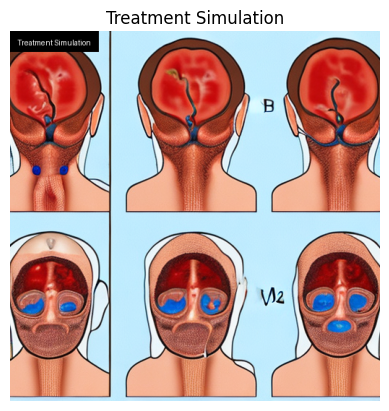

  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


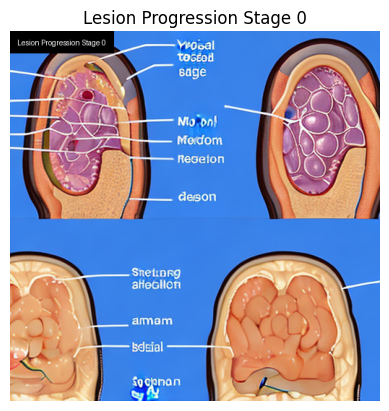

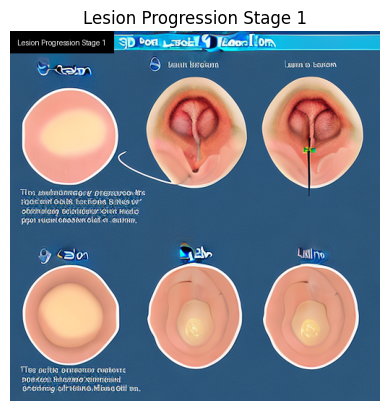

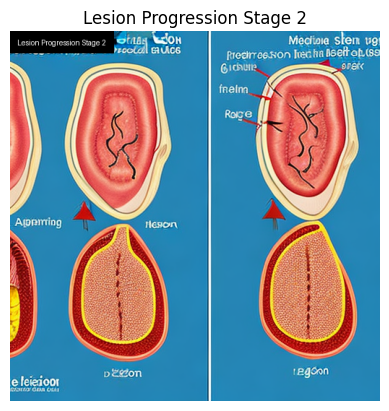

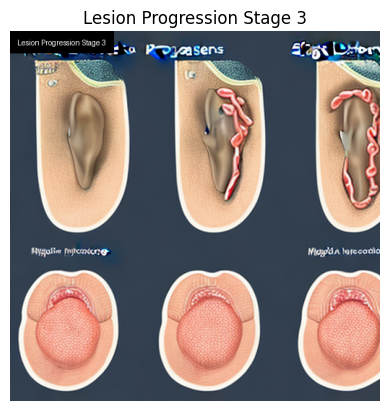

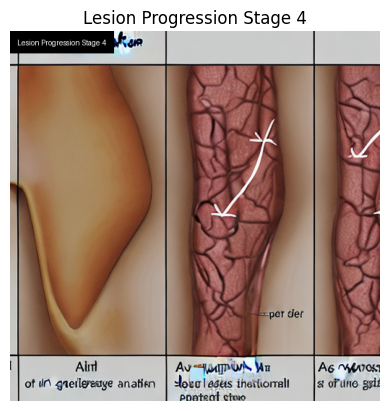

  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


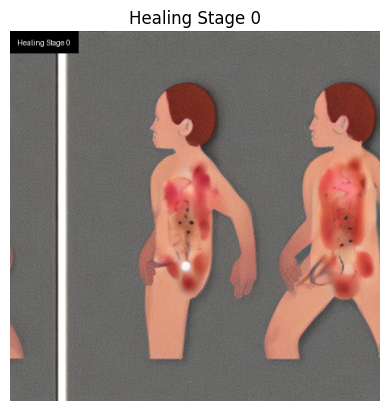

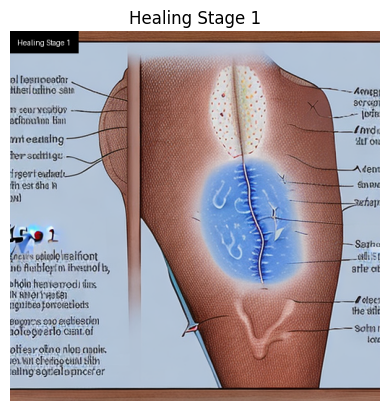

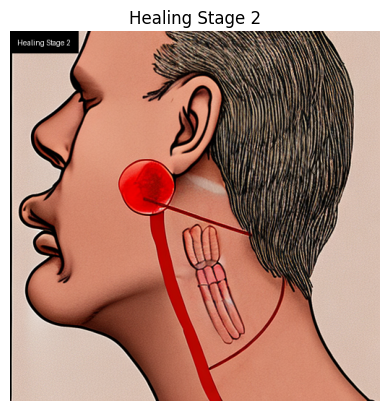

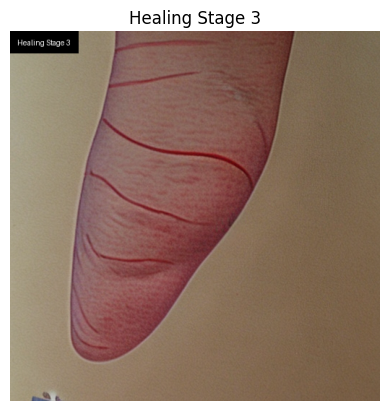

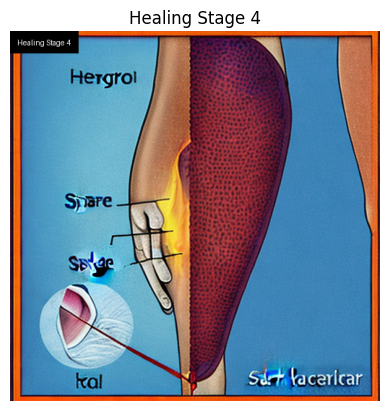

In [8]:
import torch
from diffusers import StableDiffusionPipeline
from torch.amp import autocast
from PIL import Image, ImageDraw, ImageFont
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define global DEVICE for PyTorch usage
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

# ---------------------------
# Utility Function: Draw Label
# ---------------------------
def draw_label(img, label_text, font_size=32, padding=10):
    """
    Overlays a clear label on the image with a solid rectangle background.
    Uses textbbox to measure text size.
    """
    # Ensure the image is in RGB mode
    if img.mode != "RGB":
        img = img.convert("RGB")
        
    draw = ImageDraw.Draw(img)
    
    # Attempt to load a TrueType font. Adjust the path if necessary.
    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf", font_size)
    except Exception as e:
        print("Error loading font, using default font.", e)
        font = ImageFont.load_default()
    
    # Use textbbox to determine text size
    text_bbox = draw.textbbox((0, 0), label_text, font=font)
    text_width = text_bbox[2] - text_bbox[0]
    text_height = text_bbox[3] - text_bbox[1]
    
    # Calculate background rectangle coordinates
    rect_x0 = 0
    rect_y0 = 0
    rect_x1 = text_width + 2 * padding
    rect_y1 = text_height + 2 * padding
    
    # Draw a filled rectangle for contrast
    draw.rectangle([rect_x0, rect_y0, rect_x1, rect_y1], fill="black")
    
    # Draw the text with a stroke for additional clarity
    text_position = (padding, padding)
    draw.text(text_position, label_text, font=font, fill="white", stroke_width=2, stroke_fill="black")
    
    return img

# ---------------------------
# GEN-AI Simulation Pipeline Class
# ---------------------------
class MediScanGenAISimulation:
    def __init__(self):
        self.pipe = None

    def init_genai(self):
        from diffusers import StableDiffusionPipeline
        # Use a lighter pretrained model ("stabilityai/stable-diffusion-2-base") for reduced VRAM usage.
        self.pipe = StableDiffusionPipeline.from_pretrained(
            "stabilityai/stable-diffusion-2-base",
            revision="fp16",
            torch_dtype=torch.float16
        ).to(DEVICE)
        self.pipe.enable_model_cpu_offload()
        try:
            self.pipe.enable_xformers_memory_efficient_attention()
        except ModuleNotFoundError:
            print("xformers not available; proceeding without it.")
        print("GEN-AI simulation pipeline initialized with stabilityai/stable-diffusion-2-base.")

    def generate_simulation(self, input_image_path, prompt=None, guidance_scale=7.0, num_inference_steps=20):
        """
        Generates a simulation image from a given input image using text guidance.
        """
        image = Image.open(input_image_path).convert("RGB")
        if prompt is None:
            prompt = "Medical illustration showing skin lesion progression over time."
        # Run inference using autocast with new syntax
        with torch.inference_mode():
            with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                output = self.pipe(
                    prompt=prompt,
                    guidance_scale=guidance_scale,
                    num_inference_steps=num_inference_steps
                )
                sim_image = output.images[0]
        # Overlay a clear label onto the simulation image
        sim_image = draw_label(sim_image, "Treatment Simulation", font_size=32)
        return sim_image

    def generate_lesion_progression(self, prompt_base, num_stages=5, guidance_scale=8.0, num_inference_steps=20):
        """
        Generates a sequence of images illustrating lesion progression.
        """
        images = []
        for stage in range(num_stages):
            prompt = f"{prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    img = output.images[0]
                    # Overlay a label indicating the progression stage
                    img = draw_label(img, f"Lesion Progression Stage {stage}", font_size=32)
                    images.append(img)
        return images

    def generate_healing_progression(self, diagnosis, treatment_type="surgery", guidance_scale=8.0, num_inference_steps=20):
        """
        Generates a sequence of images simulating post-treatment healing.
        """
        healing_prompts = {
            "surgery": "Scar healing after surgical removal of skin cancer",
            "radiation": "Healing of irradiated skin after radiation therapy",
            "topical": "Gradual fading of skin lesion with topical treatment"
        }
        prompt_base = healing_prompts.get(treatment_type, "Healing of skin lesion")
        images = []
        for stage in range(5):
            prompt = f"Medical illustration showing {diagnosis} healing: {prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    img = output.images[0]
                    # Overlay a clear label for the healing stage
                    img = draw_label(img, f"Healing Stage {stage}", font_size=32)
                    images.append(img)
        return images

# ---------------------------
# Example Usage of GEN-AI Simulation Pipeline
# ---------------------------
if __name__ == "__main__":
    sim_pipeline = MediScanGenAISimulation()
    sim_pipeline.init_genai()
    
    # Replace with the actual path to a lesion image in your Kaggle workspace
    sample_image_path = "/kaggle/working/train/akiec/ISIC_0024329.jpg"
    
    simulation_image = sim_pipeline.generate_simulation(sample_image_path)
    plt.imshow(simulation_image)
    plt.title("Treatment Simulation")
    plt.axis('off')
    plt.show()
    
    progression_images = sim_pipeline.generate_lesion_progression("Medical illustration showing skin lesion progression")
    for idx, img in enumerate(progression_images):
        plt.figure()
        plt.imshow(img)
        plt.title(f"Lesion Progression Stage {idx}")
        plt.axis('off')
        plt.show()
    
    healing_images = sim_pipeline.generate_healing_progression("mel", treatment_type="surgery")
    for idx, img in enumerate(healing_images):
        plt.figure()
        plt.imshow(img)
        plt.title(f"Healing Stage {idx}")
        plt.axis('off')
        plt.show()


Using device: cuda
Loaded metadata with classes: ['nv', 'mel', 'bkl', 'bcc', 'akiec', 'vasc', 'df']
Enhanced detection model built with YOLO cropping and simplified classification head.
Model compiled with focal loss and advanced metrics.
Found 8012 files belonging to 7 classes.
Found 2003 files belonging to 7 classes.

Starting training of the detection model...
Epoch 1/100
126/126 [==============================] - ETA: 0s - loss: 0.8416 - accuracy: 0.1701 - f1_score: 0.1053 - kappa: 0.0161 - precision: 0.1716 - recall: 0.0540 - auc: 0.5121
Epoch 1: val_f1_score improved from -inf to 0.02078, saving model to best_model.keras
Epoch 1: LR = 0.000100
126/126 [==============================] - 162s 1s/step - loss: 0.8416 - accuracy: 0.1701 - f1_score: 0.1053 - kappa: 0.0161 - precision: 0.1716 - recall: 0.0540 - auc: 0.5121 - val_loss: 0.6569 - val_accuracy: 0.0574 - val_f1_score: 0.0208 - val_kappa: -6.2978e-04 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.4876
Epoch

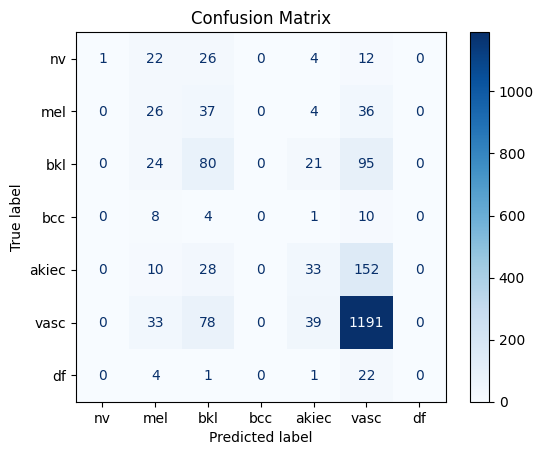

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/pipeline_loading_utils.py:221: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2-base via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-base/snapshots/1cb61502fc8b634cdb04e7cd69e06051a728bedf/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


xformers not available; proceeding without it.
GEN-AI simulation pipeline initialized with stabilityai/stable-diffusion-2-base.
1/1 [==============================] - 2s 2s/step


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/892M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

Device set to use cuda:0


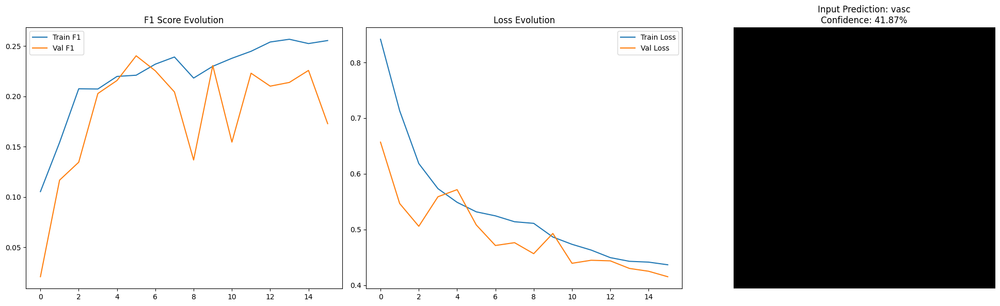

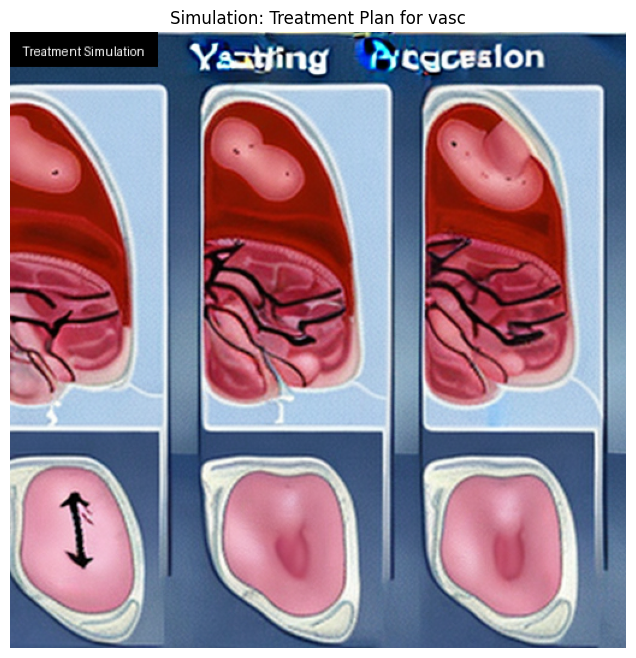


Explanation (Multilingual):
en: A patient is diagnosed with vasc. Explain in en: A patient is diagnosed with vasc. Explain in en: A patient is diagnosed with vasc. Explain in en: A patient is diagnosed with vasc. Explain in en: A patient is diagnosed with vasc. Explain in en: A patient is diagnosed with vasc. Explain in en: A patient is diagnosed with vasc. Explain in en: A patient is diagnosed with vasc. Explain in


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


  0%|          | 0/20 [00:00<?, ?it/s]

Error loading font, using default font. cannot open resource


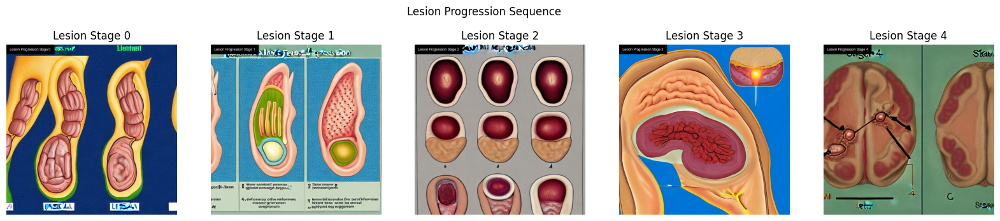

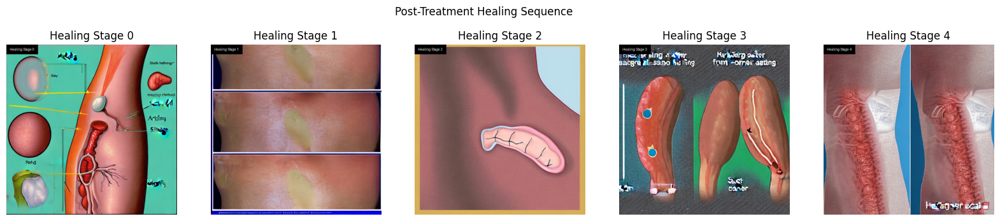

In [13]:
# ============================
# Integrated Pipeline for MediScan Companion
# ============================

# ---------- Imports ----------
import os
import json
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
from PIL import Image, ImageDraw, ImageFont
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Input, 
                                     Dropout, Lambda, RandomFlip, RandomRotation,
                                     RandomContrast, RandomZoom, BatchNormalization)
from tensorflow.keras.models import Model
import tensorflow_addons as tfa
from ultralytics import YOLO
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from transformers import pipeline  # For RAG Chatbot
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# ---------- Global Device ----------
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

# ---------- Custom Orthogonal Regularizer ----------
class OrthogonalRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, strength=1e-4):
        self.strength = strength
    def __call__(self, x):
        x_flat = tf.reshape(x, (-1, x.shape[-1]))
        prod = tf.matmul(tf.transpose(x_flat), x_flat)
        identity = tf.eye(tf.shape(prod)[0])
        diff = prod - identity
        return self.strength * tf.reduce_sum(tf.square(diff))
    def get_config(self):
        return {'strength': float(self.strength)}

# ---------- Custom Focal Loss with Label Smoothing ----------
import tensorflow.keras.backend as K
def focal_loss(label_smoothing=0.1, gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = 1e-7
        ls = tf.cast(label_smoothing, y_true.dtype)
        num_classes = tf.cast(tf.shape(y_true)[-1], y_true.dtype)
        # Apply label smoothing
        y_true = y_true * (1 - ls) + ls / num_classes
        y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
        loss = -y_true * alpha * K.pow((1 - y_pred), gamma) * K.log(y_pred)
        return K.sum(loss, axis=1)
    return focal_loss_fixed

# ---------- Warmup Cosine Decay Learning Rate Scheduler ----------
class WarmupCosineDecay(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, initial_lr=1e-4, total_steps=1000, warmup_steps=100):
        super(WarmupCosineDecay, self).__init__()
        self.initial_lr = initial_lr
        self.total_steps = total_steps
        self.warmup_steps = tf.cast(warmup_steps, tf.float32)
        self.cosine_decay = tf.keras.optimizers.schedules.CosineDecayRestarts(
            initial_learning_rate=initial_lr,
            first_decay_steps=total_steps - warmup_steps,
            t_mul=1.0,
            m_mul=0.9,
            alpha=1e-6
        )
    def __call__(self, step):
        step = tf.cast(step, tf.float32)
        return tf.cond(
            step < self.warmup_steps,
            lambda: self.initial_lr * (step / self.warmup_steps),
            lambda: self.cosine_decay(step - self.warmup_steps)
        )
    def get_config(self):
        return {
            'initial_lr': self.initial_lr,
            'total_steps': self.total_steps,
            'warmup_steps': self.warmup_steps.numpy()
        }

lr_schedule = WarmupCosineDecay(initial_lr=1e-4, total_steps=1000, warmup_steps=100)

# ---------- Advanced Custom Data Augmentation ----------
def advanced_augment(image):
    # Input: 4D tensor [batch, H, W, C]
    image = tf.image.random_hue(image, max_delta=0.08)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    batch_size = tf.shape(image)[0]
    height = tf.cast(tf.shape(image)[1], tf.float32)
    crop_size = tf.cast(0.9 * height, tf.int32)
    image = tf.image.random_crop(image, size=[batch_size, crop_size, crop_size, 3])
    image = tf.image.resize(image, [128, 128])
    angles = tf.random.uniform([batch_size], minval=-15, maxval=15, dtype=tf.float32) * (3.14159265/180)
    image = tfa.image.rotate(image, angles=angles, interpolation='BILINEAR')
    return image

# ---------- YOLO-based Detection & Cropping Function ----------
yolo_model = YOLO('yolov8n.pt', task='detect')
yolo_model.fuse = lambda verbose=False: None  # Disable fusion to save memory

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.6):
    # image_tensor: NumPy array with values in [0,1]
    image_np = (image_tensor * 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    results = yolo_model(image_bgr, verbose=False)
    if len(results) > 0:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if valid_boxes.size > 0:
            areas = (valid_boxes[:,2] - valid_boxes[:,0]) * (valid_boxes[:,3] - valid_boxes[:,1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            pad_x = int(0.1 * (x2 - x1))
            pad_y = int(0.1 * (y2 - y1))
            x1, y1 = max(0, x1 - pad_x), max(0, y1 - pad_y)
            x2, y2 = x2 + pad_x, y2 + pad_y
            cropped = image_bgr[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped.astype(np.float32) / 255.0
    resized = cv2.resize(image_bgr, (target_size, target_size))
    resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)

# ---------- MediScan Detection & Classification Pipeline (YOLO + EfficientNet) ----------
class MediScanDetectionModel:
    def __init__(self, num_classes=7, img_size=128):
        self.num_classes = num_classes
        self.img_size = img_size
        self.metadata = None
        self.model = None

    def load_metadata(self, metadata_path):
        with open(metadata_path, 'r') as f:
            loaded_meta = json.load(f)
        if isinstance(loaded_meta, list):
            unique_labels = sorted({entry['dx'] for entry in loaded_meta})
            self.metadata = {
                "features": {"label": {"names": unique_labels, "count": len(unique_labels)}},
                "samples": loaded_meta
            }
        else:
            self.metadata = loaded_meta
        print("Loaded metadata with classes:", self.metadata['features']['label']['names'])

    def build_ensemble(self):
        input_img = Input(shape=(self.img_size, self.img_size, 3), name='input_image')
        # Built-in augmentations
        x = RandomFlip("horizontal_and_vertical")(input_img)
        x = RandomRotation(0.3)(x)
        x = RandomContrast(0.2)(x)
        x = RandomZoom(0.2)(x)
        x = Lambda(lambda img: advanced_augment(img))(x)
        # YOLO cropping via Lambda (tf.numpy_function + tf.map_fn)
        def detect_and_crop(batch):
            return tf.map_fn(lambda img: tf.numpy_function(yolo_crop_wrapper, [img], tf.float32),
                             batch, fn_output_signature=tf.float32)
        cropped_imgs = Lambda(detect_and_crop, name='yolo_crop')(x)
        cropped_imgs.set_shape((None, self.img_size, self.img_size, 3))
        # EfficientNetB4 backbone with frozen early layers
        effnet = EfficientNetB4(include_top=False, weights='imagenet', input_tensor=cropped_imgs)
        for layer in effnet.layers[:150]:
            layer.trainable = False
        features = GlobalAveragePooling2D()(effnet.output)
        dropout_layer = Dropout(0.8)(features)
        dense_layer = Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=1e-4))(dropout_layer)
        bn_layer = BatchNormalization()(dense_layer)
        outputs = Dense(self.num_classes, activation='softmax', kernel_regularizer=OrthogonalRegularizer(1e-4))(bn_layer)
        self.model = Model(inputs=input_img, outputs=outputs)
        print("Enhanced detection model built with YOLO cropping and simplified classification head.")

    def compile_model(self):
        optimizer = tfa.optimizers.AdamW(
            learning_rate=lr_schedule,
            weight_decay=1e-4,
            clipnorm=1.0
        )
        self.model.compile(
            optimizer=optimizer,
            loss=focal_loss(label_smoothing=0.1),
            metrics=[
                tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
                tfa.metrics.F1Score(num_classes=self.num_classes, average='macro', name='f1_score'),
                tfa.metrics.CohenKappa(num_classes=self.num_classes, name='kappa'),
                tf.keras.metrics.Precision(name='precision'),
                tf.keras.metrics.Recall(name='recall'),
                tf.keras.metrics.AUC(name='auc', multi_label=True)
            ]
        )
        print("Model compiled with focal loss and advanced metrics.")

    def train(self, train_ds, val_ds, epochs=100):
        callbacks = [
            tf.keras.callbacks.EarlyStopping(monitor='val_f1_score', patience=10, mode='max',
                                             restore_best_weights=True, min_delta=0.001),
            tf.keras.callbacks.CSVLogger('training_log.csv'),
            tf.keras.callbacks.ModelCheckpoint(filepath='best_model.keras', monitor='val_f1_score',
                                               save_best_only=True, save_weights_only=True, mode='max', verbose=1),
            tf.keras.callbacks.LambdaCallback(
                on_epoch_end=lambda epoch, logs: print(f"Epoch {epoch+1}: LR = {float(self.model.optimizer.lr(self.model.optimizer.iterations)):.6f}")
            )
        ]
        history = self.model.fit(
            train_ds.prefetch(tf.data.AUTOTUNE),
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            verbose=1
        )
        return history

# ---------- GEN-AI Simulation Pipeline ----------
class MediScanGenAISimulation:
    def __init__(self):
        self.pipe = None

    def init_genai(self):
        torch.cuda.empty_cache()
        from diffusers import StableDiffusionPipeline
        self.pipe = StableDiffusionPipeline.from_pretrained(
            "stabilityai/stable-diffusion-2-base",
            revision="fp16",
            torch_dtype=torch.float16
        ).to(DEVICE)
        self.pipe.enable_model_cpu_offload()
        try:
            self.pipe.enable_xformers_memory_efficient_attention()
        except ModuleNotFoundError:
            print("xformers not available; proceeding without it.")
        print("GEN-AI simulation pipeline initialized with stabilityai/stable-diffusion-2-base.")

    def generate_simulation(self, input_image_path, prompt=None, guidance_scale=7.0, num_inference_steps=20):
        image = Image.open(input_image_path).convert("RGB")
        if prompt is None:
            prompt = "Medical illustration showing skin lesion progression over time."
        with torch.inference_mode():
            with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                output = self.pipe(
                    prompt=prompt,
                    guidance_scale=guidance_scale,
                    num_inference_steps=num_inference_steps
                )
                sim_image = output.images[0]
        sim_image = draw_label(sim_image, "Treatment Simulation", font_size=32)
        return sim_image

    def generate_lesion_progression(self, prompt_base, num_stages=5, guidance_scale=8.0, num_inference_steps=20):
        images = []
        for stage in range(num_stages):
            prompt = f"{prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    img = output.images[0]
                    img = draw_label(img, f"Lesion Progression Stage {stage}", font_size=32)
                    images.append(img)
        return images

    def generate_healing_progression(self, diagnosis, treatment_type="surgery", guidance_scale=8.0, num_inference_steps=20):
        healing_prompts = {
            "surgery": "Scar healing after surgical removal of skin cancer",
            "radiation": "Healing of irradiated skin after radiation therapy",
            "topical": "Gradual fading of skin lesion with topical treatment"
        }
        prompt_base = healing_prompts.get(treatment_type, "Healing of skin lesion")
        images = []
        for stage in range(5):
            prompt = f"Medical illustration showing {diagnosis} healing: {prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    img = output.images[0]
                    img = draw_label(img, f"Healing Stage {stage}", font_size=32)
                    images.append(img)
        return images

# ---------- Visualization Utilities ----------
def visualize_results(history, sample_image, sample_label, gen_output):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['f1_score'], label='Train F1')
    plt.plot(history.history['val_f1_score'], label='Val F1')
    plt.title('F1 Score Evolution')
    plt.legend()
    
    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Evolution')
    plt.legend()
    
    plt.subplot(1, 3, 3)
    plt.imshow(sample_image.numpy().astype(np.uint8))
    plt.title(f"Input Prediction: {gen_output['diagnosis']}\nConfidence: {gen_output['confidence']:.2%}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(8, 8))
    plt.imshow(gen_output['image'])
    plt.title(f"Simulation: Treatment Plan for {gen_output['diagnosis']}")
    plt.axis('off')
    plt.show()

def plot_confusion_matrix(model, dataset, class_names):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        preds = model.predict(images)
        y_true.extend(np.argmax(labels, axis=1))
        y_pred.extend(np.argmax(preds, axis=1))
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

# ---------- Main Execution Flow (Multimodal Integration & RAG Chatbot) ----------
if __name__ == "__main__":
    # Initialize detection and simulation pipelines
    mediscan = MediScanDetectionModel(num_classes=7, img_size=128)
    genai = MediScanGenAISimulation()
    
    metadata_path = '/kaggle/working/metadata_processed.json'
    mediscan.load_metadata(metadata_path)
    
    # Build, compile, and (re)train the detection model
    mediscan.build_ensemble()
    mediscan.compile_model()
    
    # Create TF datasets from organized train/validation folders
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/train',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/validation',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    train_ds = train_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    val_ds = val_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    
    print("\nStarting training of the detection model...")
    history = mediscan.train(train_ds, val_ds, epochs=100)
    mediscan.model.save('/kaggle/working/models/final_model')
    print("Detection model saved successfully.")
    
    plot_confusion_matrix(mediscan.model, val_ds, mediscan.metadata['features']['label']['names'])
    
    # Initialize the GEN-AI simulation pipeline
    genai.init_genai()
    
    # Get a sample image from the validation dataset and generate simulation conditioned on detection output
    sample_images, sample_labels = next(iter(val_ds))
    sample_image = sample_images[0]
    sample_tensor = tf.expand_dims(sample_image, 0)
    
    with tf.device('/CPU:0'):
        pred = mediscan.model.predict(sample_tensor)
    diagnosis_idx = np.argmax(pred)
    confidence = np.max(pred)
    diagnosis = mediscan.metadata['features']['label']['names'][diagnosis_idx]
    gen_output = {'diagnosis': diagnosis, 'confidence': float(confidence)}
    
    # Save the sample image temporarily for simulation conditioning
    temp_path = '/kaggle/working/train/akiec/ISIC_0024329.jpg'
    Image.fromarray((sample_image.numpy()*255).astype(np.uint8)).save(temp_path)
    
    # Create a prompt based on detection output and generate simulation
    prompt = f"Medical illustration showing {diagnosis} treatment progression"
    sim_image = genai.generate_simulation(temp_path, prompt=prompt)
    gen_output['image'] = sim_image
    
    # Generate multilingual explanation using the RAG Chatbot
    explanation = generate_explanation(diagnosis, language="en")
    
    # Visualize integrated results: training curves, detection output, simulation image, and explanation
    visualize_results(history, sample_image, sample_labels[0], gen_output)
    print("\nExplanation (Multilingual):")
    print(explanation)
    
    # Generate additional simulation sequences: lesion progression and healing simulation
    sample_image_pil = Image.fromarray((sample_image.numpy()*255).astype(np.uint8))
    lesion_progression = genai.generate_lesion_progression("Medical illustration showing skin lesion progression")
    healing_progression = genai.generate_healing_progression(diagnosis, treatment_type="surgery")
    
    # Visualize lesion progression images
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(lesion_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Lesion Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Lesion Progression Sequence")
    plt.show()
    
    # Visualize healing progression images
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(healing_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Healing Stage {i}")
        axs[i].axis('off')   
    plt.suptitle("Post-Treatment Healing Sequence")
    plt.show()


In [6]:
# ============================
# Integrated Pipeline for MediScan Companion (Improved Version)
# ============================

# ---------- Imports ----------
import os
import json
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from datetime import datetime
from PIL import Image, ImageDraw, ImageFont
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Input, 
                                     Dropout, Lambda, RandomFlip, RandomRotation,
                                     RandomContrast, RandomZoom, BatchNormalization)
from tensorflow.keras.models import Model
import tensorflow_addons as tfa
from ultralytics import YOLO
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from transformers import pipeline   # for the RAG Chatbot
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# ---------- Global Device ----------
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")
# ---------- Utility: draw_label ----------
def draw_label(image, text, font_size=32, position=(10, 10), font_path=None):
    """
    Draws `text` onto a PIL.Image `image` at `position`.
    Tries to load a truetype font, falls back to default if unavailable.
    """
    draw = ImageDraw.Draw(image)
    # try truetype, else default
    try:
        if font_path is None:
            # PIL’s bundled DejaVu font
            font = ImageFont.truetype("DejaVuSans.ttf", font_size)
        else:
            font = ImageFont.truetype(font_path, font_size)
    except (IOError, OSError):
        font = ImageFont.load_default()
    # optional: draw a semi‑transparent box behind text
    text_w, text_h = draw.textsize(text, font=font)
    rect_xy = [position,
               (position[0] + text_w + 4, position[1] + text_h + 4)]
    draw.rectangle(rect_xy, fill=(0,0,0,127))
    draw.text((position[0] + 2, position[1] + 2),
              text, font=font, fill=(255,255,255))
    return image


# ---------- Custom Orthogonal Regularizer ----------
class OrthogonalRegularizer(tf.keras.regularizers.Regularizer):
    def __init__(self, strength=1e-4):
        self.strength = strength
    def __call__(self, x):
        x_flat = tf.reshape(x, (-1, x.shape[-1]))
        prod = tf.matmul(tf.transpose(x_flat), x_flat)
        identity = tf.eye(tf.shape(prod)[0])
        diff = prod - identity
        return self.strength * tf.reduce_sum(tf.square(diff))
    def get_config(self):
        return {'strength': float(self.strength)}

# ---------- Custom Focal Loss with Label Smoothing ----------
import tensorflow.keras.backend as K
def focal_loss(label_smoothing=0.1, gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = 1e-7
        ls = tf.cast(label_smoothing, y_true.dtype)
        num_classes = tf.cast(tf.shape(y_true)[-1], y_true.dtype)
        # Apply label smoothing
        y_true = y_true * (1 - ls) + ls / num_classes
        y_pred = K.clip(y_pred, epsilon, 1.0 - epsilon)
        loss = -y_true * alpha * K.pow((1 - y_pred), gamma) * K.log(y_pred)
        return K.sum(loss, axis=1)
    return focal_loss_fixed

# ---------- Warmup Cosine Decay Learning Rate Scheduler ----------
class WarmupCosineDecay(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, initial_lr=1e-4, total_steps=1000, warmup_steps=100):
        super(WarmupCosineDecay, self).__init__()
        self.initial_lr = initial_lr
        self.total_steps = total_steps
        self.warmup_steps = tf.cast(warmup_steps, tf.float32)
        self.cosine_decay = tf.keras.optimizers.schedules.CosineDecayRestarts(
            initial_learning_rate=initial_lr,
            first_decay_steps=total_steps - warmup_steps,
            t_mul=1.0,
            m_mul=0.9,
            alpha=1e-6
        )
    def __call__(self, step):
        step = tf.cast(step, tf.float32)
        return tf.cond(
            step < self.warmup_steps,
            lambda: self.initial_lr * (step / self.warmup_steps),
            lambda: self.cosine_decay(step - self.warmup_steps)
        )
    def get_config(self):
        return {
            'initial_lr': self.initial_lr,
            'total_steps': self.total_steps,
            'warmup_steps': self.warmup_steps.numpy()
        }

lr_schedule = WarmupCosineDecay(initial_lr=1e-4, total_steps=1000, warmup_steps=100)

# ---------- Advanced Custom Data Augmentation ----------
def advanced_augment(image):
    # Input: 4D tensor [batch, H, W, C]
    image = tf.image.random_hue(image, max_delta=0.08)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    batch_size = tf.shape(image)[0]
    height = tf.cast(tf.shape(image)[1], tf.float32)
    crop_size = tf.cast(0.9 * height, tf.int32)
    image = tf.image.random_crop(image, size=[batch_size, crop_size, crop_size, 3])
    image = tf.image.resize(image, [128, 128])
    angles = tf.random.uniform([batch_size], minval=-15, maxval=15, dtype=tf.float32) * (3.14159265/180)
    image = tfa.image.rotate(image, angles=angles, interpolation='BILINEAR')
    return image

# ---------- YOLO-based Detection & Cropping Function ----------
yolo_model = YOLO('yolov8n.pt', task='detect')
yolo_model.fuse = lambda verbose=False: None  # Disable fusion to save memory

def yolo_detect_crop(image_tensor, target_size=128, confidence_threshold=0.6):
    # image_tensor: NumPy array with values in [0,1]
    image_np = (image_tensor * 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    results = yolo_model(image_bgr, verbose=False)
    if len(results) > 0:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        valid_boxes = boxes[confidences >= confidence_threshold]
        if valid_boxes.size > 0:
            areas = (valid_boxes[:,2] - valid_boxes[:,0]) * (valid_boxes[:,3] - valid_boxes[:,1])
            best_box = valid_boxes[np.argmax(areas)]
            x1, y1, x2, y2 = map(int, best_box)
            pad_x = int(0.1 * (x2 - x1))
            pad_y = int(0.1 * (y2 - y1))
            x1, y1 = max(0, x1 - pad_x), max(0, y1 - pad_y)
            x2, y2 = x2 + pad_x, y2 + pad_y
            cropped = image_bgr[y1:y2, x1:x2]
            cropped = cv2.resize(cropped, (target_size, target_size))
            cropped = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
            return cropped.astype(np.float32) / 255.0
    resized = cv2.resize(image_bgr, (target_size, target_size))
    resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    return resized.astype(np.float32) / 255.0

def yolo_crop_wrapper(image):
    return yolo_detect_crop(image)

# ---------- MediScan Detection & Classification Pipeline (YOLO + EfficientNet) ----------
class MediScanDetectionModel:
    def __init__(self, num_classes=7, img_size=128):
        self.num_classes = num_classes
        self.img_size = img_size
        self.metadata = None
        self.model = None

    def load_metadata(self, metadata_path):
        with open(metadata_path, 'r') as f:
            loaded_meta = json.load(f)
        if isinstance(loaded_meta, list):
            unique_labels = sorted({entry['dx'] for entry in loaded_meta})
            self.metadata = {
                "features": {"label": {"names": unique_labels, "count": len(unique_labels)}},
                "samples": loaded_meta
            }
        else:
            self.metadata = loaded_meta
        print("Loaded metadata with classes:", self.metadata['features']['label']['names'])

    def build_ensemble(self):
        input_img = Input(shape=(self.img_size, self.img_size, 3), name='input_image')
        # Built-in augmentations
        x = RandomFlip("horizontal_and_vertical")(input_img)
        x = RandomRotation(0.3)(x)
        x = RandomContrast(0.2)(x)
        x = RandomZoom(0.2)(x)
        x = Lambda(lambda img: advanced_augment(img))(x)
        # YOLO cropping via Lambda using tf.numpy_function + tf.map_fn
        def detect_and_crop(batch):
            return tf.map_fn(lambda img: tf.numpy_function(yolo_crop_wrapper, [img], tf.float32),
                             batch, fn_output_signature=tf.float32)
        cropped_imgs = Lambda(detect_and_crop, name='yolo_crop')(x)
        cropped_imgs.set_shape((None, self.img_size, self.img_size, 3))
        # EfficientNetB4 backbone with more trainable layers for fine-tuning (unfreeze from layer 100)
        effnet = EfficientNetB4(include_top=False, weights='imagenet', input_tensor=cropped_imgs)
        for layer in effnet.layers[:100]:
            layer.trainable = False
        # Increase capacity in the classification head
        features = GlobalAveragePooling2D()(effnet.output)
        dropout_layer = Dropout(0.5)(features)  # reduce dropout to retain capacity
        dense_layer = Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=1e-4))(dropout_layer)
        bn_layer = BatchNormalization()(dense_layer)
        outputs = Dense(self.num_classes, activation='softmax', kernel_regularizer=OrthogonalRegularizer(1e-4))(bn_layer)
        self.model = Model(inputs=input_img, outputs=outputs)
        print("Enhanced detection model built with YOLO cropping and modified classification head.")

    def compile_model(self):
        optimizer = tfa.optimizers.AdamW(
            learning_rate=lr_schedule,
            weight_decay=1e-4,
            clipnorm=1.0
        )
        self.model.compile(
            optimizer=optimizer,
            loss=focal_loss(label_smoothing=0.1),
            metrics=[
                tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
                tfa.metrics.F1Score(num_classes=self.num_classes, average='macro', name='f1_score'),
                tfa.metrics.CohenKappa(num_classes=self.num_classes, name='kappa'),
                tf.keras.metrics.Precision(name='precision'),
                tf.keras.metrics.Recall(name='recall'),
                tf.keras.metrics.AUC(name='auc', multi_label=True)
            ]
        )
        print("Model compiled with focal loss and advanced metrics.")

    def train(self, train_ds, val_ds, epochs=100):
        callbacks = [
            tf.keras.callbacks.EarlyStopping(monitor='val_f1_score', patience=10, mode='max',
                                             restore_best_weights=True, min_delta=0.001),
            tf.keras.callbacks.CSVLogger('training_log.csv'),
            tf.keras.callbacks.ModelCheckpoint(filepath='best_model.keras', monitor='val_f1_score',
                                               save_best_only=True, save_weights_only=True, mode='max', verbose=1),
            tf.keras.callbacks.LambdaCallback(
                on_epoch_end=lambda epoch, logs: print(f"Epoch {epoch+1}: LR = {float(self.model.optimizer.lr(self.model.optimizer.iterations)):.6f}")
            )
        ]
        history = self.model.fit(
            train_ds.prefetch(tf.data.AUTOTUNE),
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            verbose=1
        )
        return history

# ---------- GEN-AI Simulation Pipeline ----------
class MediScanGenAISimulation:
    def __init__(self):
        self.pipe = None

    def init_genai(self):
        torch.cuda.empty_cache()
        from diffusers import StableDiffusionPipeline
        self.pipe = StableDiffusionPipeline.from_pretrained(
            "stabilityai/stable-diffusion-2-base",
            revision="fp16",
            torch_dtype=torch.float16
        ).to(DEVICE)
        self.pipe.enable_model_cpu_offload()
        try:
            self.pipe.enable_xformers_memory_efficient_attention()
        except ModuleNotFoundError:
            print("xformers not available; proceeding without it.")
        print("GEN-AI simulation pipeline initialized with stabilityai/stable-diffusion-2-base.")

    def generate_simulation(self, input_image_path, prompt=None, guidance_scale=7.0, num_inference_steps=20):
        image = Image.open(input_image_path).convert("RGB")
        if prompt is None:
            prompt = "Medical illustration showing skin lesion progression over time."
        with torch.inference_mode(), torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            output = self.pipe(
                prompt=prompt,
                guidance_scale=guidance_scale,
                num_inference_steps=num_inference_steps
            )
            sim_image = output.images[0]
        # <— now this will work, because draw_label is already defined
        sim_image = draw_label(sim_image, "Treatment Simulation", font_size=32)
        return sim_image

    def generate_lesion_progression(self, prompt_base, num_stages=5, guidance_scale=8.0, num_inference_steps=20):
        images = []
        for stage in range(num_stages):
            prompt = f"{prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    img = output.images[0]
                    img = draw_label(img, f"Lesion Progression Stage {stage}", font_size=32)
                    images.append(img)
        return images

    def generate_healing_progression(self, diagnosis, treatment_type="surgery", guidance_scale=8.0, num_inference_steps=20):
        healing_prompts = {
            "surgery": "Scar healing after surgical removal of skin cancer",
            "radiation": "Healing of irradiated skin after radiation therapy",
            "topical": "Gradual fading of skin lesion with topical treatment"
        }
        prompt_base = healing_prompts.get(treatment_type, "Healing of skin lesion")
        images = []
        for stage in range(5):
            prompt = f"Medical illustration showing {diagnosis} healing: {prompt_base}, stage {stage}"
            with torch.inference_mode():
                with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                    output = self.pipe(
                        prompt=prompt,
                        guidance_scale=guidance_scale,
                        num_inference_steps=num_inference_steps
                    )
                    img = output.images[0]
                    img = draw_label(img, f"Healing Stage {stage}", font_size=32)
                    images.append(img)
        return images

# ---------- RAG Chatbot for Multilingual Explanation ----------
def generate_explanation(diagnosis, language="en"):
    """
    Generates a detailed, multilingual explanation and recommendations using a pre-trained T5 model.
    The prompt is designed to yield a comprehensive, step-by-step explanation.
    """
    text_gen = pipeline("text2text-generation", model="t5-base", device=0)
    prompt = (f"Explain in {language} in detail: A patient has been diagnosed with {diagnosis}. "
              "Provide an in-depth explanation of the condition, discuss the underlying pathology, "
              "and offer clear recommendations for treatment. Break down the treatment simulation "
              "step-by-step and describe what each stage represents in layman's terms.")
    explanation = text_gen(prompt, max_length=200)[0]['generated_text']
    return explanation

# ---------- Visualization Utilities ----------
def visualize_results(history, sample_image, sample_label, gen_output):
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.plot(history.history['f1_score'], label='Train F1')
    plt.plot(history.history['val_f1_score'], label='Val F1')
    plt.title('F1 Score Evolution')
    plt.legend()
    
    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss Evolution')
    plt.legend()
    
    plt.subplot(1, 3, 3)
    plt.imshow(sample_image.numpy().astype(np.uint8))
    plt.title(f"Input Prediction: {gen_output['diagnosis']}\nConfidence: {gen_output['confidence']:.2%}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(8,8))
    plt.imshow(gen_output['image'])
    plt.title(f"Simulation: Treatment Plan for {gen_output['diagnosis']}")
    plt.axis('off')
    plt.show()

def plot_confusion_matrix(model, dataset, class_names):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        preds = model.predict(images)
        y_true.extend(np.argmax(labels, axis=1))
        y_pred.extend(np.argmax(preds, axis=1))
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

# ---------- Main Execution Flow (Multimodal Integration & RAG Chatbot) ----------
if __name__ == "__main__":
    # Initialize detection and simulation pipelines
    mediscan = MediScanDetectionModel(num_classes=7, img_size=128)
    genai = MediScanGenAISimulation()
    
    metadata_path = '/kaggle/working/metadata_processed.json'
    mediscan.load_metadata(metadata_path)
    
    # Build, compile, and train the detection model.
    mediscan.build_ensemble()
    mediscan.compile_model()
    
    # Create TF datasets from your organized train/validation folders
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/train',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        '/kaggle/working/validation',
        image_size=(128, 128),
        batch_size=64,
        label_mode='int'
    )
    train_ds = train_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    val_ds = val_ds.map(lambda x, y: (tf.cast(x, tf.float32)/255.0, tf.one_hot(y, depth=7)))
    
    print("\nStarting training of the detection model...")
    history = mediscan.train(train_ds, val_ds, epochs=100)
    mediscan.model.save('/kaggle/working/models/final_model')
    print("Detection model saved successfully.")
    
    plot_confusion_matrix(mediscan.model, val_ds, mediscan.metadata['features']['label']['names'])
    
    # Initialize the GEN-AI simulation pipeline
    genai.init_genai()
    
    # Get a sample image from the validation dataset and generate simulation conditioned on detection output
    sample_images, sample_labels = next(iter(val_ds))
    sample_image = sample_images[0]
    sample_tensor = tf.expand_dims(sample_image, 0)
    
    with tf.device('/CPU:0'):
        pred = mediscan.model.predict(sample_tensor)
    diagnosis_idx = np.argmax(pred)
    confidence = np.max(pred)
    diagnosis = mediscan.metadata['features']['label']['names'][diagnosis_idx]
    gen_output = {'diagnosis': diagnosis, 'confidence': float(confidence)}
    
    # Use the sample image directly as conditioning; alternatively, save a temporary file.
    temp_path = '/kaggle/working/validation/vasc/ISIC_0025197.jpg'
    Image.fromarray((sample_image.numpy()*255).astype(np.uint8)).save(temp_path)
    prompt = f"Medical illustration showing {diagnosis} treatment progression"
    sim_image = genai.generate_simulation(temp_path, prompt=prompt)
    gen_output['image'] = sim_image
    
    # Generate detailed multilingual explanation using the RAG Chatbot component
    explanation = generate_explanation(diagnosis, language="en")
    
    # Visualize integrated results: training curves, detection output, simulation image, and explanation
    visualize_results(history, sample_image, sample_labels[0], gen_output)
    print("\nDetailed Explanation (Multilingual):")
    print(explanation)
    
    # Generate additional simulation sequences: lesion progression and healing simulation
    sample_image_pil = Image.fromarray((sample_image.numpy()*255).astype(np.uint8))
    lesion_progression = genai.generate_lesion_progression("Medical illustration showing skin lesion progression")
    healing_progression = genai.generate_healing_progression(diagnosis, treatment_type="surgery")
    
    # Visualize lesion progression images
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))
    for i, img in enumerate(lesion_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Lesion Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Lesion Progression Sequence")
    plt.show()
    
    # Visualize healing progression images
    fig, axs = plt.subplots(1, 5, figsize=(20, 4))A
    for i, img in enumerate(healing_progression):
        axs[i].imshow(img)
        axs[i].set_title(f"Healing Stage {i}")
        axs[i].axis('off')
    plt.suptitle("Post-Treatment Healing Sequence")
    plt.show()


Using device: cuda
Loaded metadata with classes: ['nv', 'mel', 'bkl', 'bcc', 'akiec', 'vasc', 'df']
71686520/71686520 [==============================] - 3s 0us/step
Enhanced detection model built with YOLO cropping and modified classification head.
Model compiled with focal loss and advanced metrics.
Found 8012 files belonging to 7 classes.
Found 2003 files belonging to 7 classes.

Starting training of the detection model...
Epoch 1/100
126/126 [==============================] - ETA: 0s - loss: 1.0375 - accuracy: 0.2491 - f1_score: 0.1389 - kappa: 0.0614 - precision: 0.3253 - recall: 0.1194 - auc: 0.5605
Epoch 1: val_f1_score improved from -inf to 0.10669, saving model to best_model.keras
Epoch 1: LR = 0.000100
126/126 [==============================] - 163s 1s/step - loss: 1.0375 - accuracy: 0.2491 - f1_score: 0.1389 - kappa: 0.0614 - precision: 0.3253 - recall: 0.1194 - auc: 0.5605 - val_loss: 0.8588 - val_accuracy: 0.2796 - val_f1_score: 0.1067 - val_kappa: 0.0158 - val_precision: 0

KeyboardInterrupt: 

In [ ]:
import os
import tempfile
import streamlit as st
import tensorflow as tf
import numpy as np
import torch
from PIL import Image

# Ensure Kaggle working directory is in path
import sys
sys.path.append('/kaggle/working')

# Import your MediScan pipeline components
from mediscan_companion_improved import (
    MediScanDetectionModel,
    MediScanGenAISimulation,
    generate_explanation
)

# ------------------------
# Page Config & Styling
# ------------------------
st.set_page_config(
    page_title="MediScan Companion",
    layout="wide",
    initial_sidebar_state="collapsed"
)
st.markdown("""
<style>
body { background-color: #f5f5f5; }
.stButton>button { background-color: #4CAF50; color: white; }
.st-bf { border-radius: 12px; box-shadow: 0 4px 6px rgba(0,0,0,0.1); }
</style>
""", unsafe_allow_html=True)

# ------------------------
# Sidebar Controls
# ------------------------
st.sidebar.header("⚙️ Configuration & Controls")
model_path = st.sidebar.text_input(
    "Keras model weights:", "./models/final_model"
)
metadata_path = st.sidebar.text_input(
    "Metadata JSON:", "./metadata_processed.json"
)
num_progression = st.sidebar.slider(
    "Lesion progression stages:", 3, 7, 5
)
treatment_type = st.sidebar.selectbox(
    "Healing treatment type:", ["surgery", "radiation", "topical"]
)

# ------------------------
# Model Loading (cached)
# ------------------------
@st.cache_resource
def load_models(mp, meta):
    # Detection pipeline
    det = MediScanDetectionModel(num_classes=7, img_size=128)
    det.load_metadata(meta)
    det.build_ensemble()
    det.compile_model()
    det.model.load_weights(mp)

    # Generative AI pipeline with device precision handling
    gen = MediScanGenAISimulation()
    if torch.cuda.is_available():
        gen.init_genai()
    else:
        # CPU fallback: load full-precision model
        from diffusers import StableDiffusionPipeline
        gen.pipe = StableDiffusionPipeline.from_pretrained(
            "stabilityai/stable-diffusion-2-base"
        ).to("cpu")
        gen.device = "cpu"
    return det, gen

with st.spinner("Loading models... this may take a minute..."):
    detection_model, genai_model = load_models(model_path, metadata_path)

# ------------------------
# Main Interface
# ------------------------
st.title("🩺 MediScan Companion")
st.write("**Interactive AI for dermatological lesion analysis, treatment simulation & explanations.**")

uploaded = st.file_uploader("Upload a dermoscopic image:", type=["png", "jpg", "jpeg"])
if not uploaded:
    st.info("Please upload an image to get started.")
    st.stop()

# Save uploaded image to temporary file
tmp_dir = tempfile.gettempdir()
input_path = os.path.join(tmp_dir, "uploaded_lesion.jpg")
with open(input_path, "wb") as f:
    f.write(uploaded.getbuffer())

# Display original image and ROI crop
orig = Image.open(input_path).convert("RGB")
col1, col2 = st.columns(2)
with col1:
    st.image(orig, caption="Original Image", use_column_width=True)
with col2:
    st.subheader("ROI Detection & Crop Preview")
    arr = np.array(orig) / 255.0
    crop = detection_model.yolo_crop_wrapper(arr)
    crop_img = Image.fromarray((crop * 255).astype(np.uint8))
    st.image(crop_img, caption="Cropped Lesion", use_column_width=True)

# Classification results
st.markdown("---")
st.subheader("🔍 Classification Result")
input_tensor = tf.expand_dims(crop, 0)
preds = detection_model.model.predict(input_tensor)
idx = int(np.argmax(preds[0])); conf = float(preds[0][idx])
label = detection_model.metadata['features']['label']['names'][idx]
st.markdown(f"**Diagnosis:** `{label}`  \n**Confidence:** {conf:.1%}")

metric_col1, metric_col2 = st.columns(2)
metric_col1.metric("Confidence", f"{conf:.1%}")
metric_col2.metric("Predicted Class", label)

# Tabs: Simulation & Sequences
tabs = st.tabs(["Treatment Simulation", "Progression & Healing"])

with tabs[0]:
    st.subheader("🎨 Treatment Simulation")
    prompt = f"Medical illustration showing {label} treatment progression"
    crop_path = os.path.join(tmp_dir, "crop_lesion.jpg")
    crop_img.save(crop_path)
    with st.spinner("Generating simulation..."), st.empty():
        sim_img = genai_model.generate_simulation(crop_path, prompt=prompt)
    st.image(sim_img, caption="Treatment Simulation", use_column_width=True)

    st.subheader("💬 AI Explanation")
    with st.expander("View Explanation"):
        expl = generate_explanation(label, language="en")
        st.write(expl)
        st.download_button(
            "Download Explanation",
            data=expl,
            file_name="explanation.txt",
            mime="text/plain"
        )

    st.download_button(
        "Download Simulation Image",
        data=sim_img.tobytes(),
        file_name="simulation.png",
        mime="image/png"
    )

with tabs[1]:
    st.subheader("➡️ Lesion Progression Sequence")
    prog = genai_model.generate_lesion_progression(
        "Medical illustration showing skin lesion progression",
        num_stages=num_progression
    )
    st.image(prog, width=100, caption=[f"Stage {i+1}" for i in range(len(prog))])

    st.subheader("🩹 Healing Progression Sequence")
    heal = genai_model.generate_healing_progression(
        label,
        treatment_type=treatment_type,
        num_stages=num_progression
    )
    st.image(heal, width=100, caption=[f"Stage {i+1}" for i in range(len(heal))])

# Footer
st.markdown("---")
st.write("Maintained by MediScan Companion Team | Powered by Streamlit, TensorFlow, Ultralytics, Diffusers, Transformers.")


In [18]:
!pip install streamlit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 53.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 92.8 MB/s eta 0:00:00:00:0100:01


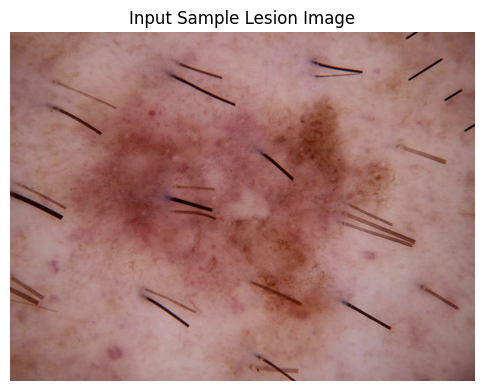

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Device set to use cuda:0


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

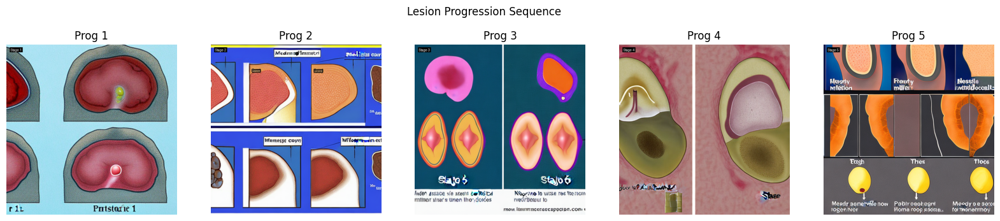

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

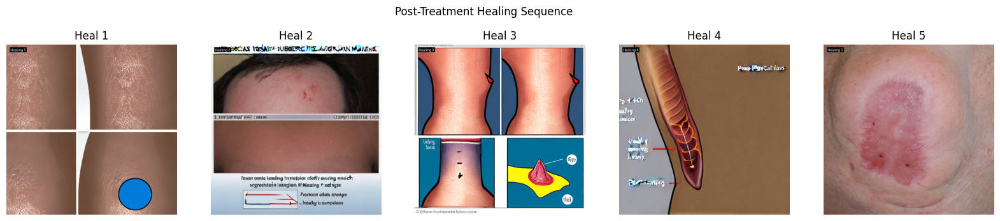


=== RAG Chatbot Explanation ===

en: The patient has been diagnosed with melanoma. Explain in en: The patient has been diagnosed with melanoma. Explain in en: The patient has been diagnosed with melanoma. Explain in en: The patient has been diagnosed with melanoma. Provide a clear, step-by-step explanation of the condition, underlying pathology, and describe what each simulated stage represents in layman's terms.

=== End of Explanation ===


In [14]:
import os
import torch
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from diffusers import StableDiffusionPipeline
from transformers import pipeline

# --------------------------
# Utility: draw_label
# --------------------------
def draw_label(image, text, font_size=24, position=(10, 10), font_path=None):
    draw = ImageDraw.Draw(image)
    try:
        font = ImageFont.truetype(font_path or "DejaVuSans.ttf", font_size)
    except (IOError, OSError):
        font = ImageFont.load_default()
    # Compute text bounding box for text size
    try:
        bbox = draw.textbbox(position, text, font=font)
        text_w, text_h = bbox[2] - bbox[0], bbox[3] - bbox[1]
    except AttributeError:
        text_w, text_h = draw.textsize(text, font=font)
    # Draw semi-transparent background rectangle
    rect_xy = [position, (position[0] + text_w + 4, position[1] + text_h + 4)]
    draw.rectangle(rect_xy, fill=(0, 0, 0, 160))
    # Draw text label
    draw.text((position[0] + 2, position[1] + 2), text, font=font, fill=(255, 255, 255))
    return image

# --------------------------
# Gen-AI Simulation Class
# --------------------------
class GenAISimulator:
    def __init__(self, model_name="stabilityai/stable-diffusion-2-base", device=None):
        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")
        # Load model in FP16 variant
        self.pipe = StableDiffusionPipeline.from_pretrained(
            model_name,
            variant="fp16",
            torch_dtype=torch.float16,
            safety_checker=None
        ).to(self.device)
        self.pipe.enable_attention_slicing()

    def generate_stage_images(self, base_prompt, stages=5, guidance_scale=7.5, steps=20):
        images = []
        for i in range(stages):
            prompt = f"{base_prompt}, stage {i+1}"
            with torch.inference_mode(), torch.amp.autocast(self.device):
                result = self.pipe(
                    prompt=prompt,
                    guidance_scale=guidance_scale,
                    num_inference_steps=steps
                )
            img = result.images[0].convert("RGB")
            draw_label(img, f"Stage {i+1}")
            images.append(img)
        return images

    def generate_healing_images(self, diagnosis, treatment="surgery", stages=5, guidance_scale=7.5, steps=20):
        heal_prompts = {
            "surgery": "Post-surgical scar healing",
            "radiation": "Radiation therapy skin healing",
            "topical": "Topical treatment skin healing"
        }
        base = heal_prompts.get(treatment, heal_prompts["surgery"])
        images = []
        for i in range(stages):
            prompt = f"Medical illustration of {diagnosis} healing: {base}, stage {i+1}"
            with torch.inference_mode(), torch.amp.autocast(self.device):
                result = self.pipe(
                    prompt=prompt,
                    guidance_scale=guidance_scale,
                    num_inference_steps=steps
                )
            img = result.images[0].convert("RGB")
            draw_label(img, f"Healing {i+1}")
            images.append(img)
        return images

# --------------------------
# RAG Chatbot Explanation
# --------------------------
def generate_explanation(diagnosis, language="en"):  # T5-based explanation
    rag = pipeline(
        "text2text-generation",
        model="t5-base",
        device=0
    )
    prompt = (
        f"Explain in {language}: The patient has been diagnosed with {diagnosis}. "
        "Provide a clear, step-by-step explanation of the condition, underlying pathology, "
        "and describe what each simulated stage represents in layman's terms."
    )
    output = rag(prompt, max_length=256, num_beams=4, early_stopping=True)
    return output[0]["generated_text"]

# --------------------------
# Main: sample upload, simulation + explanation
# --------------------------
if __name__ == "__main__":
    # --- User inputs ---
    sample_image_path = "/kaggle/working/validation/mel/ISIC_0024323.jpg"  # place your test image here
    diagnosis_label = "melanoma"             # replace with your model's predicted label

    # --- Display sample image ---
    if os.path.exists(sample_image_path):
        sample_img = Image.open(sample_image_path).convert("RGB")
        plt.figure(figsize=(6,6))
        plt.imshow(sample_img)
        plt.title("Input Sample Lesion Image")
        plt.axis('off')
        plt.show()
    else:
        print(f"[Warning] Sample image not found at '{sample_image_path}'.\n" \
              "Please add your test image file with that name and rerun.")

    # --- Initialize components ---
    simulator = GenAISimulator()
    explanation = generate_explanation(diagnosis_label, language="en")

    # --- Generate and display progression images ---
    prog_images = simulator.generate_stage_images(
        base_prompt=f"Medical illustration of {diagnosis_label} progression"
    )
    fig, axs = plt.subplots(1, len(prog_images), figsize=(4 * len(prog_images), 4))
    for idx, img in enumerate(prog_images):
        axs[idx].imshow(img)
        axs[idx].axis('off')
        axs[idx].set_title(f"Prog {idx+1}")
    plt.suptitle("Lesion Progression Sequence")
    plt.show()

    # --- Generate and display healing images ---
    heal_images = simulator.generate_healing_images(
        diagnosis=diagnosis_label,
        treatment="surgery"
    )
    fig, axs = plt.subplots(1, len(heal_images), figsize=(4 * len(heal_images), 4))
    for idx, img in enumerate(heal_images):
        axs[idx].imshow(img)
        axs[idx].axis('off')
        axs[idx].set_title(f"Heal {idx+1}")
    plt.suptitle("Post-Treatment Healing Sequence")
    plt.show()

    # --- Print RAG Chatbot explanation ---
    print("\n=== RAG Chatbot Explanation ===\n")
    print(explanation)
    print("\n=== End of Explanation ===")

ModuleNotFoundError: No module named 'simulation_explanation_module'